This is analysis is based on the daily reports from the John Hopkins GitHub Repository: https://github.com/CSSEGISandData/COVID-19.

The data in the charts has been normalized both with regard to population and time. The horizontal axes are the number of days since Confirmed occurrences exceed the population for the region divided by ten million. For the linear scale charts, the vertical axes are a multiplier for each day of those occurrences on the first day. The log scale charts are the log base 10 values of the multipliers. This methodology was first proposed by Kevin Drum of Mother Jones who has kept a running account of the COVID-19 trends on his blog: https://www.motherjones.com/kevin-drum/.

The notebook is parameterized for US states, with a special cases for Italy and the Hubei province in China. Add or remove names from the lists to present your charts of interest. Similar to the United States, companion notebooks could be created for states and provinces in other regions.

For a more complete listing of the available global data sources take a look at the COVID-19 dataset clearinghouse: https://asone.ai/polymath/index.php?title=COVID-19_dataset_clearinghouse.

The COVID Tracking project has detailed daily numbers for the US: https://github.com/COVID19Tracking/covid-tracking-data

The CDC has provisional data for US states: https://data.cdc.gov/api/views/r8kw-7aab/rows.csv?accessType=DOWNLOAD&api_foundry=true

In [1]:
import pandas as pd
from sodapy import Socrata
import numpy as np
from datetime import datetime, date, timedelta
from dateutil.relativedelta import relativedelta
import zipfile as zf
import math
import sys, os

Subdirectories

In [2]:
rootdir = os.path.realpath("..")
datadir = os.path.join(rootdir, "data")
popdir = os.path.join(datadir, "pop")
deathdir = os.path.join(datadir, "death")

List of countries

In [3]:
glob_locs = ["Italy"]

List of provinces in China. Get the population numbers manually from: https://www.worldatlas.com/articles/chinese-provinces-by-population.html

In [4]:
cn_locs = ["Hubei"]
cn_population = {"Hubei":"57,237,740"}

List of states to exclude

In [5]:
us_exclude_locs = []

List of states for clinical analysis

In [6]:
us_clinical_locs = ["New York", "New Jersey", "California", "Michigan", "Massachusetts", "Florida", "Pennsylvania", "Texas", "Connecticut", "North Carolina"]

Translate location name to abbreviation

In [7]:
def _state_loc_abbrev(loc):
    """
    Translate state location name to two character abbreviation
    
    Parameters
    ---------
    loc : string
        State location name
        
    Returns
    -------
    Two character abbreviation
    """
    xlator = {
        "New York" : "NY",
        "New Jersey" : "NJ",
        "Washington" : "WA",
        "California" : "CA",
        "Michigan" : "MI",
        "Massachusetts" : "MA",
        "Illinois" : "IL",
        "Florida" : "FL",
        "Louisiana" : "LA",
        "Pennsylvania" : "PA",
        "Colorado" : "CO",
        "Georgia" : "GA",
        "Texas" : "TX",
        "Connecticut" : "CT",
        "North Carolina" : "NC",
        "Indiana" : "IN",
        "Alabama" : "AL",
        "Alaska" : "AK",
        "Arizona" : "AZ",
        "Arkansas" : "AR",
        "Delaware" : "DE",
        "District of Columbia" : "DC",
        "Hawaii" : "HI",
        "Idaho" : "ID",
        "Iowa" : "IA",
        "Kansas" : "KS",
        "Kentucky" : "KY",
        "Maine" : "ME",
        "Maryland" : "MD",
        "Minnesota" : "MN",
        "Mississippi" : "MS",
        "Missouri" : "MO",
        "Montana" : "MT",
        "Nebraska" : "NE",
        "Nevada" : "NV",
        "New Hampshire" : "NH",
        "New Mexico" : "NM",
        "North Dakota" : "ND",
        "Ohio" : "OH",
        "Oklahoma" : "OK",
        "Oregon" : "OR",
        "Rhode Island" : "RI",
        "South Carolina" : "SC",
        "South Dakota" : "SD",
        "Tennessee" : "TN",
        "Utah" : "UT",
        "Vermont" : "VT",
        "Virginia" : "VA",
        "West Virginia" : "WV",
        "Wisconsin" : "WI",
        "Wyoming" : "WY",
    }
    return xlator.get(loc, "")

Translation clinical category to column label

In [8]:
def _clinical_label(category):
    """
    Translate category name to label in ctp_tracking
    
    Parmaters
    ---------
    loc : string
        Category name
        
    Returns
    -------
    Column label
    """
    xlator = {
        "TestPositive" : "positive",
        "TestNegative" : "negative",
        "TestPending" : "pending",
        "InHospital" : "hospitalizedCurrently",
        "InICU" : "inIcuCurrently",
        "OnVentilator" : "onVentilatorCurrently"
    }
    return xlator.get(category, "")

Generate list of dates

In [9]:
def _date_range(start, end):
    """
    Generate dates in the form: <dd>-<mm>-<yyyy>

    Parameters
    ----------
    start : string
        Start date in range.
    end : string
        End date in range.

    Returns
    -------
    Sequence of dates.

    """
    start_date = start.split('-')
    sdate = date(int(start_date[2]), int(start_date[0]), int(start_date[1]))
    end_date = end.split('-')
    edate = date(int(end_date[2]), int(end_date[0]), int(end_date[1]))
    
    delta = edate - sdate
    
    i = 0
    while i < delta.days + 1:
        idate = sdate + timedelta(days = i)
        day = idate.strftime("%m-%d-%Y")
        yield day
        i += 1

Extract incidents from daily reports

In [10]:
def _trend(trend_report, scope, category, locs, trend):
    """
    Parameters:
        trend_report - raw data organized by date: dictionary of dataframes
        scope - level of analysis, e.g. country (0), state (1): integer
        category - type of trend, e.g. Confirmed, Deaths, Recovered, Active: string
        locs - locations to analyze, e.g. Italy, etc.: list of strings
        trend - trend tables: dictionary of dataframes
    """
    for loc in locs:
        t = trend[category][(trend[category]['Location'] == loc)]['Threshold']
        incident_threshold = t.item()
        j = 0
        for idate in _date_range(start, end_date):
            incident_report = trend_report[idate]
            total_incidents = 0
            
            label = []
            label.append(incident_report.columns[1])
            label.append(incident_report.columns[0])
            # Early reports use 'Country/Region' and 'Province/State' column labels
            # later reports use 'Country_Region' and 'Province_State'
            if label[0] != 'Country/Region' or label[1] != 'Province/State':
                # Switch to 'Country_Region' and 'Province_State' column labels
                label[0] = incident_report.columns[3]
                label[1] = incident_report.columns[2]
                assert label[0] == "Country_Region" and label[1] == "Province_State"
                
            incident_df = incident_report[(incident_report[label[scope]] == loc)]
            
            series_loc = loc
            # Reports have changed how they list the United Kingdom
            if loc == "United Kingdom":
                if len(incident_df) == 0:
                    series_loc = "UK"
                    incident_df = incident_report[(incident_report[label[scope]] == series_loc)]
                    
            # Reports have changed how they list South Korea
            if loc == "South Korea":
                if len(incident_df) == 0:
                    series_loc = "Republic of Korea"
                    incident_df = incident_report[(incident_report[label[scope]] == series_loc)]
                if len(incident_df) == 0:
                    series_loc = "Korea, South"
                    incident_df = incident_report[(incident_report[label[scope]] == series_loc)]
              
            # Early reports do not have all categories
            if incident_df.empty or category not in incident_df.columns:
                continue
            
            incidents_by_scope = incident_report.groupby([label[scope]])[category].sum()
            total_incidents = incidents_by_scope.loc[[series_loc]][0]

            try:
                # Replace state incidents with available data from CSSE US tracking
                if scope == 1 and idate in daily_us_report.keys():
                    us_day_report = daily_us_report[idate]
                    daily_series = us_day_report[(us_day_report[label[scope]] == loc)]
                    if len(daily_series) > 0 and category in daily_series.columns:
                        alt_incidents = daily_series[category].item()
                        if not np.isnan(alt_incidents):
                            total_incidents = alt_incidents
            except NameError:
                # Dataframe daily_us_report not available in this notebook
                pass
                    
            try:
                # Collect recovered data from CTP US tracking
                if category == "Recovered" and total_incidents == 0:
                    state_abbrev = _state_loc_abbrev(loc)
                    if len(state_abbrev) > 0 and idate in ctp_tracking.keys():
                        state_series = ctp_tracking[idate][(ctp_tracking[idate]["state"] == state_abbrev)]
                        if len(state_series) > 0:
                            recovered = state_series["recovered"].item()
                            if not np.isnan(recovered):
                                total_incidents = int(recovered)
            except NameError:
                # Dataframe ctp_tracking not available in this notebook
                pass
                
            # Many reports do not have "Active" data, ignore negative incidents
            if category == "Active" and (category not in incident_report.columns or total_incidents <= 0):
                # Calculate as: confirmed - (deaths + recovered)
                confirmed_series = trend["Confirmed"].loc[(trend["Confirmed"]['Location'] == loc), "Day{0:d}".format(j + 1)]
                confirmed = incident_threshold * confirmed_series.item()
                deaths_series = trend["Deaths"].loc[(trend["Deaths"]['Location'] == loc), "Day{0:d}".format(j + 1)]
                deaths = incident_threshold * deaths_series.item()
                recovered_series = trend["Recovered"].loc[(trend["Recovered"]['Location'] == loc), "Day{0:d}".format(j + 1)]
                recovered = incident_threshold * recovered_series.item()
                total_incidents = confirmed - (deaths + recovered)

            # Record trends for all categories when Confirmed threshold is met
            tc = "Confirmed"
            cur_date = idate.split('-')
            cdate = date(int(cur_date[2]), int(cur_date[0]), int(cur_date[1]))
            match_date = trend[category].loc[(trend[category]['Location'] == loc), "Start Date"].item()
            if len(match_date) == 0:
                # Initialize the start date for category
                conf_date = trend[tc].loc[(trend[tc]['Location'] == loc), "Start Date"].item()
                if category == tc and incident_threshold < total_incidents:
                    trend[category].loc[(trend[category]['Location'] == loc), "Start Date"] = idate
                elif len(match_date) <= 0:
                    trend[category].loc[(trend[category]['Location'] == loc), "Start Date"] = conf_date
            
            match_date = trend[category].loc[(trend[category]['Location'] == loc), "Start Date"].item()
            if len(match_date) > 0:
                match_date = match_date.split('-')
                mdate = date(int(match_date[2]), int(match_date[0]), int(match_date[1]))
                if cdate >= mdate:
                    j += 1
                    trend[category].loc[(trend[category]['Location'] == loc),
                                               "Day{0:d}".format(j)] = total_incidents / incident_threshold
                    
        trend[category].loc[(trend[category]['Location'] == loc), "Last Day"] = j

Extract incidents from daily tracking

In [11]:
def _clinical_trend(trend_report, scope, category, locs, trend):
    """
    Parameters:
        trend_report - raw data organized by date: dictionary of dataframes
        scope - level of analysis, e.g. country (0), state (1): integer
        category - type of trend, e.g. Confirmed, Deaths, Recovered, Active: string
        locs - locations to analyze, e.g. Italy, etc.: list of strings
        trend - trend tables: dictionary of dataframes
    """
    for loc in locs:
        loc_abbrev = _state_loc_abbrev(loc)
        if len(loc_abbrev) == 0:
            continue

        t = trend[category][(trend[category]['Location'] == loc)]['Threshold']
        incident_threshold = t.item()
        j = 0
        for idate in _date_range(start, end_date):
            if idate not in trend_report.keys():
                continue

            incident_report = trend_report[idate]
            incidents = 0
            loc_series = incident_report[(incident_report["state"] == loc_abbrev)]
            if len(loc_series) == 0:
                continue

            count = loc_series[_clinical_label(category)].item()
            if not np.isnan(count):
                incidents = count

            # Record trends for all categories when Confirmed threshold is met
            cur_date = idate.split('-')
            cdate = date(int(cur_date[2]), int(cur_date[0]), int(cur_date[1]))
            match_date = trend[category].loc[(trend[category]['Location'] == loc), "Start Date"].item()
            if len(match_date) == 0:
                # Initialize the start date for category
                conf_date = trend["Confirmed"].loc[(trend["Confirmed"]['Location'] == loc), "Start Date"].item()
                if category == "Confirmed" and incident_threshold < total_incidents:
                    trend[category].loc[(trend[category]['Location'] == loc), "Start Date"] = idate
                elif len(match_date) <= 0:
                    trend[category].loc[(trend[category]['Location'] == loc), "Start Date"] = conf_date

            match_date = trend[category].loc[(trend[category]['Location'] == loc), "Start Date"].item()
            if len(match_date) > 0:
                match_date = match_date.split('-')
                mdate = date(int(match_date[2]), int(match_date[0]), int(match_date[1]))
                if cdate >= mdate:
                    j += 1
                    trend[category].loc[(trend[category]['Location'] == loc),
                                               "Day{0:d}".format(j)] = incidents / incident_threshold
                    
        trend[category].loc[(trend[category]['Location'] == loc), "Last Day"] = j

Read country populations from UN. Upload the file 'SYB62_1_201907_Population,_Surface_Area_and_Density.csv' from https://data.un.org/_Docs/SYB/CSV/SYB62_1_201907_Population,%20Surface%20Area%20and%20Density.csv to the data/pop subdirectory.

In [12]:
global_population_file = os.path.join(popdir, "SYB62_1_201907_Population,_Surface_Area_and_Density.csv")
global_population = pd.read_csv(global_population_file, encoding="latin-1")

Read United States state populations from US Census. Upload the file 'nst-est2019-01.csv' from https://www.census.gov/data/tables/time-series/demo/popest/2010s-state-total.html to the data/pop subdirectory.

In [13]:
us_population_file = os.path.join(popdir, "nst-est2019-01.csv")
us_population = pd.read_csv(us_population_file)

Start and ending dates for reports

In [14]:
start = "01-22-2020"
end = date.today().strftime("%m-%d-%Y")

Read daily records from John Hopkins. Clone the git repository: https://github.com/CSSEGISandData/COVID-19. Zip the COVID-19\csse_covid_19_data\csse_covid_19_daily_reports directory and upload the .zip file to the data subdirectory. Write the extracted files to a US state subdirectory to allow notebooks running in parallel.

In [15]:
statedir = os.path.join(datadir, "us/state")

# Extract files from zip archive
zipfile = os.path.join(datadir, "csse_covid_19_daily_reports.zip")
files = zf.ZipFile(zipfile, 'r')
files.extractall(statedir)
files.close()

days = 0
daily_report = {}
report_dir = os.path.join(statedir, "csse_covid_19_daily_reports")
for iday in _date_range(start, end):
    try:
        report_file = os.path.join(report_dir, "{}.csv".format(iday))
        daily_report[iday] = pd.read_csv(report_file)
        end_date = iday
        days += 1
    except:
        pass

last_report = daily_report[end_date]

Read weekly death data from CDC. Upload the file 'Provisional_COVID-19_Death_Counts_by_Week_Ending_Date_and_State.csv' from https://data.cdc.gov/api/views/r8kw-7aab/rows.csv?accessType=DOWNLOAD&api_foundry=true to the data/death subdirectory.

In [16]:
cdc_2020_deaths_file = os.path.join(deathdir, "Provisional_COVID-19_Death_Counts_by_Week_Ending_Date_and_State.csv")
cdc_2020_deaths = pd.read_csv(cdc_2020_deaths_file)
# Extract first and last week
start_cdc_week = cdc_2020_deaths["Start week"][0]
end_cdc_week = cdc_2020_deaths["Data as of"][0]

Read weekly 2014-2018 death data from CDC. Upload the file 'Weekly_Counts_of_Deaths_by_State_and_Select_Causes__2014-2018.csv' from https://data.cdc.gov/NCHS/Weekly-Counts-of-Deaths-by-State-and-Select-Causes/3yf8-kanr to the Jupyter folder containing the notebook.

In [17]:
cdc_2018_deaths_file = os.path.join(deathdir, "Weekly_Counts_of_Deaths_by_State_and_Select_Causes__2014-2018.csv")
cdc_2018_deaths = pd.read_csv(cdc_2018_deaths_file)

Collect weekly CDC total deaths from 2018 for the time period corresponding to the 2020 data.

In [18]:
weekly_deaths_by_year = cdc_2018_deaths.groupby(["MMWR Year"])
weekly_2018_deaths = None
for i, week in enumerate(weekly_deaths_by_year):
    if week[0] == 2018:
        weekly_2018_deaths = week[1]
        break
weekly_2018_deaths["Week Ending Date"] = pd.to_datetime(weekly_2018_deaths["Week Ending Date"])
start_week = datetime.strptime(start_cdc_week, '%m/%d/%Y') - relativedelta(years = 2)
end_week = datetime.strptime(end_cdc_week, '%m/%d/%Y') - relativedelta(years = 2)
weekly_2018_deaths = weekly_2018_deaths[(weekly_2018_deaths["Week Ending Date"] > start_week) \
                                        & (weekly_2018_deaths["Week Ending Date"] <= end_week)]
weekly_2018_deaths_by_state = weekly_2018_deaths.groupby(["Jurisdiction of Occurrence"])["All  Cause"].sum()

Collect weekly CDC total deaths from 2020 accumulated so far

In [19]:
cdc_us_deaths_by_state = cdc_2020_deaths.groupby(["State"])["Total Deaths"].sum()
cdc_us_covid_deaths_by_state = cdc_2020_deaths.groupby(["State"])["COVID-19 Deaths"].sum()
state_list = []
for i, deaths_2020 in enumerate(cdc_us_deaths_by_state):
    covid_deaths_2020 = cdc_us_covid_deaths_by_state.iloc[i]
    state = cdc_us_deaths_by_state.index[i]
    if state == "United States" or state == "New York City" or state == "Puerto Rico":
        continue
    # Get 2018 total deaths for state
    deaths_2018 = weekly_2018_deaths_by_state[state]
    # Subtract COVID-19 deaths before comparison with 2018
    deaths_2020 -= covid_deaths_2020
    # Look up date population
    search_loc = '.' + state
    pop = us_population[(us_population['Geographic Area'] == search_loc)]['2019'].iloc[0]
    # Remove commas and divide by one million
    pop = float(pop.replace(',','')) / 10**6
    state_list.append(
        {"Location" : state, "2018 Accum Deaths" : deaths_2018, "2020 Accum Deaths" : deaths_2020, "Pop" : pop / 10.0})
# Create dataframe from list of dictionaries
cdc_state_report = pd.DataFrame(state_list)
# Add accumulated deaths ratio column
cdc_state_report["2020/2018"] = cdc_state_report["2020 Accum Deaths"] / cdc_state_report["2018 Accum Deaths"]

Determine top ten US hotspots based on accumulated per capita total deaths in CDC data.

In [20]:
# Add deaths per 10M population column
cdc_state_report["Deaths/10M"] = cdc_state_report["2020 Accum Deaths"] / cdc_state_report["Pop"]
cdc_state_report = cdc_state_report.sort_values("2020/2018", ascending = False)
# Normalize to highest
cdc_state_highest = cdc_state_report["Deaths/10M"].tolist()[0]
cdc_state_report["Normalized"] = cdc_state_report["2020/2018"].apply(lambda x: x / cdc_state_highest)
cdc_state_locs = cdc_state_report["Location"].tolist()[:10]
print(cdc_state_locs)

['Arizona', 'South Carolina', 'Wyoming', 'Colorado', 'Mississippi', 'Arkansas', 'Maryland', 'Maine', 'Virginia', 'Utah']


Determine top 10 US hotspots based on most recent total per capita COVID-19 deaths in John Hopkins data.

In [21]:
last_deaths_report_by_state = last_report.groupby(["Country_Region", "Province_State"])["Deaths"].sum()
state_deaths_list = []
for i, deaths in enumerate(last_deaths_report_by_state):
    country = last_deaths_report_by_state.index[i][0]
    if country != "US":
        continue
    state = last_deaths_report_by_state.index[i][1]
    if state == "Diamond Princess" or state == "Grand Princess" or state == "Guam" \
        or state == "Northern Mariana Islands" or state == "Puerto Rico" \
        or state == "Recovered" or state == "Virgin Islands":
        continue
    
    # Update population from global data
    search_loc = '.' + state
    pop = us_population[(us_population['Geographic Area'] == search_loc)]['2019'].iloc[0]
    # Remove commas and divide by one million
    pop = float(pop.replace(',','')) / 10**6
    state_deaths_list.append({"Location" : state, "Deaths" : deaths, "Pop" : pop / 10.0})
# Create dataframe from list of dictionaries
jh_state_deaths_report = pd.DataFrame(state_deaths_list)
# Add deaths per 10M population column
jh_state_deaths_report["Deaths/10M"] = jh_state_deaths_report["Deaths"] / jh_state_deaths_report["Pop"]
jh_state_deaths_report = jh_state_deaths_report.sort_values("Deaths/10M", ascending = False)
jh_state_deaths_highest = jh_state_deaths_report["Deaths/10M"].tolist()[0]
jh_state_deaths_report["Normalized"] = \
    jh_state_deaths_report["Deaths/10M"].apply(lambda x: x / jh_state_deaths_highest)
print(jh_state_deaths_report["Location"].tolist()[:20])

['New Jersey', 'New York', 'Massachusetts', 'Connecticut', 'Louisiana', 'Rhode Island', 'Mississippi', 'District of Columbia', 'Arizona', 'Illinois', 'Michigan', 'Florida', 'Georgia', 'South Carolina', 'Delaware', 'Maryland', 'Pennsylvania', 'Texas', 'Indiana', 'Alabama']


Determine top 10 US hotspots based on most recent total per capita COVID-19 confirmed in John Hopkins data.

In [22]:
last_confirmed_report_by_state = last_report.groupby(["Country_Region", "Province_State"])["Confirmed"].sum()
state_confirmed_list = []
for i, confirmed in enumerate(last_confirmed_report_by_state):
    country = last_confirmed_report_by_state.index[i][0]
    if country != "US":
        continue
    state = last_confirmed_report_by_state.index[i][1]
    if state == "Diamond Princess" or state == "Grand Princess" or state == "Guam" \
        or state == "Northern Mariana Islands" or state == "Puerto Rico" \
        or state == "Recovered" or state == "Virgin Islands":
        continue
    
    # Update population from global data
    search_loc = '.' + state
    pop = us_population[(us_population['Geographic Area'] == search_loc)]['2019'].iloc[0]
    # Remove commas and divide by one million
    pop = float(pop.replace(',','')) / 10**6
    state_confirmed_list.append({"Location" : state, "Confirmed" : confirmed, "Pop" : pop / 10.0})
# Create dataframe from list of dictionaries
jh_state_confirmed_report = pd.DataFrame(state_confirmed_list)
# Add confirmed per 10M population column
jh_state_confirmed_report["Confirmed/10M"] = jh_state_confirmed_report["Confirmed"] / jh_state_confirmed_report["Pop"]
jh_state_confirmed_report = jh_state_confirmed_report.sort_values("Confirmed/10M", ascending = False)
jh_state_confirmed_highest = jh_state_confirmed_report["Confirmed/10M"].tolist()[0]
jh_state_confirmed_report["Normalized"] = \
    jh_state_confirmed_report["Confirmed/10M"].apply(lambda x: x / jh_state_confirmed_highest)
print(jh_state_confirmed_report["Location"].tolist()[:20])

['Louisiana', 'Mississippi', 'North Dakota', 'Florida', 'Alabama', 'Iowa', 'Georgia', 'Tennessee', 'Arizona', 'South Dakota', 'Arkansas', 'South Carolina', 'Texas', 'Nevada', 'Idaho', 'Utah', 'Nebraska', 'Illinois', 'Wisconsin', 'Rhode Island']


Combine two top 10 deaths lists

In [23]:
state_deaths_report = pd.concat([cdc_state_report, jh_state_deaths_report], sort = False)
state_deaths_report = state_deaths_report.sort_values("Normalized", ascending = False)
us_top_deaths_locs = state_deaths_report["Location"][:20].tolist()
us_total_deaths_locs = us_top_deaths_locs + us_clinical_locs
# Remove any duplicates
us_top_deaths_locs = list(dict.fromkeys(us_top_deaths_locs))
us_total_deaths_locs = list(dict.fromkeys(us_total_deaths_locs))
# Exclude known locations
for state in us_exclude_locs:
    us_top_deaths_locs.remove(state)
print(us_top_deaths_locs)

['New Jersey', 'New York', 'Massachusetts', 'Connecticut', 'Louisiana', 'Rhode Island', 'Mississippi', 'District of Columbia', 'Arizona', 'Illinois', 'Michigan', 'Florida', 'Georgia', 'South Carolina', 'Delaware', 'Maryland', 'Pennsylvania', 'Texas', 'Indiana', 'Alabama']


Filter top 20 confirmed list

In [24]:
state_confirmed_report = jh_state_confirmed_report
state_confirmed_report = state_confirmed_report.sort_values("Normalized", ascending = False)
us_top_confirmed_locs = state_confirmed_report["Location"][:20].tolist()
us_total_confirmed_locs = us_top_confirmed_locs + us_clinical_locs
# Remove any duplicates
us_top_confirmed_locs = list(dict.fromkeys(us_top_confirmed_locs))
us_total_confirmed_locs = list(dict.fromkeys(us_total_confirmed_locs))
# Exclude known locations
for state in us_exclude_locs:
    us_top_confirmed_locs.remove(state)
print(us_top_confirmed_locs)

['Louisiana', 'Mississippi', 'North Dakota', 'Florida', 'Alabama', 'Iowa', 'Georgia', 'Tennessee', 'Arizona', 'South Dakota', 'Arkansas', 'South Carolina', 'Texas', 'Nevada', 'Idaho', 'Utah', 'Nebraska', 'Illinois', 'Wisconsin', 'Rhode Island']


Read daily US records from John Hopkins. Clone the git repository: https://github.com/CSSEGISandData/COVID-19. Zip the COVID-19\csse_covid_19_data\csse_covid_19_daily_reports_us directory and upload the .zip file to the data subdirectory.

In [25]:
# Extract files from zip archive
zipfile = os.path.join(datadir, "csse_covid_19_daily_reports_us.zip")
files = zf.ZipFile(zipfile, 'r')
files.extractall(statedir)
files.close()

daily_us_report = {}
report_dir = os.path.join(statedir, "csse_covid_19_daily_reports_us")
for iday in _date_range(start, end):
    try:
        report_file = os.path.join(report_dir, "{}.csv".format(iday))
        daily_us_report[iday] = pd.read_csv(report_file)
    except:
        pass

Read daily reports from COVID Tracking project. Clone the git repository: https://github.com/COVID19Tracking/covid-tracking-data. Upload the file 'states_daily_4pm_et.csv' from data/states_daily_4pm_et.csv to the data subdirectory.

In [26]:
ctp_daily_reports_file = os.path.join(datadir, "states_daily_4pm_et.csv")
ctp_daily_reports = pd.read_csv(ctp_daily_reports_file)
# Separate into daily reports
start_tracking = "02-28-2020"
ctp_tracking = {}
for idate in _date_range(start_tracking, end):
    ctp_date = idate.split('-')
    udate = int("{0}{1}{2}".format(ctp_date[2], ctp_date[0], ctp_date[1]))
    ctp_tracking[idate] = ctp_daily_reports[(ctp_daily_reports['date'] == udate)]

Data frame with global incident thresholds (per 10 million population) followed by placeholders for daily numbers

In [27]:
global_trend = {}
empty_date = '1990-01-01'
global_trend['Confirmed'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
global_trend['Deaths'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
global_trend['Recovered'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
global_trend['Active'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
i = 0
for loc in glob_locs:
    pop_label = loc
    if loc == "Iran":
        pop_label = "Iran (Islamic Republic of)"
    elif loc == "South Korea":
        pop_label = "Republic of Korea"
    pop = float(
        global_population[((global_population['Unnamed: 1'] == pop_label) &
                             (global_population['Year'] == 2019))]['Value'].iloc[0])
    global_trend['Confirmed'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    global_trend['Deaths'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    global_trend['Recovered'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    global_trend['Active'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    i += 1

Data frame with China province incident threshholds (per 10 million population) followed by placeholders for daily numbers

In [28]:
cn_trend = {}
cn_trend['Confirmed'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', 'Last Day'] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
cn_trend['Deaths'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
cn_trend['Recovered'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
cn_trend['Active'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
i = 0
for loc in cn_locs:
    pop = cn_population[loc]
    # Remove commas and divide by one million
    pop = float(pop.replace(',','')) / 10**6
    cn_trend['Confirmed'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    cn_trend['Deaths'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    cn_trend['Recovered'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    cn_trend['Active'].loc[i] = [loc] + [pop/10.0] + [""] + [0] + [0.0 for i in range(days)]
    i += 1

Data frames with United States incident thresholds (per 10 million population) followed by placeholders for daily numbers

In [29]:
def _add_row(days, us_population, us_incidents, i, loc):
    global global_population
    search_loc = loc
    if i > 0:
        search_loc = '.' + loc
    if loc == "US":
        pop = float(
            global_population[((global_population['Unnamed: 1'] == "United States of America") &
                                 (global_population['Year'] == 2019))]['Value'].iloc[0])
    else:
        pop = us_population[(us_population['Geographic Area'] == search_loc)]['2019'].iloc[0]
        # Remove commas and divide by one million
        pop = float(pop.replace(',','')) / 10**6
    us_incidents.loc[i] = [loc] + [pop /10.0] + [""] + [0] + [0.0 for i in range(days)]

In [30]:
us_confirmed_trend = {}
us_confirmed_trend['Confirmed'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['Deaths'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['Recovered'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['Active'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['TestPositive'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['TestNegative'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['TestPending'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['InHospital'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['InICU'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_confirmed_trend['OnVentilator'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
i = 0
_add_row(days, us_population, us_confirmed_trend['Confirmed'], i, "US")
_add_row(days, us_population, us_confirmed_trend['Deaths'], i, "US")
_add_row(days, us_population, us_confirmed_trend['Recovered'], i, "US")
_add_row(days, us_population, us_confirmed_trend['Active'], i, "US")
i += 1
for loc in us_total_confirmed_locs:
    _add_row(days, us_population, us_confirmed_trend['Confirmed'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['Deaths'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['Recovered'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['Active'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['TestPositive'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['TestNegative'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['TestPending'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['InHospital'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['InICU'], i, loc)
    _add_row(days, us_population, us_confirmed_trend['OnVentilator'], i, loc)
    i += 1

In [31]:
us_deaths_trend = {}
us_deaths_trend['Confirmed'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['Deaths'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['Recovered'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['Active'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['TestPositive'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['TestNegative'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['TestPending'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['InHospital'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['InICU'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
us_deaths_trend['OnVentilator'] = pd.DataFrame(None, columns = ['Location', 'Threshold', 'Start Date', "Last Day"] +
                                         ["Day" + "{0:d}".format(i+1) for i in range(days)])
i = 0
_add_row(days, us_population, us_deaths_trend['Confirmed'], i, "US")
_add_row(days, us_population, us_deaths_trend['Deaths'], i, "US")
_add_row(days, us_population, us_deaths_trend['Recovered'], i, "US")
_add_row(days, us_population, us_deaths_trend['Active'], i, "US")
i += 1
for loc in us_total_deaths_locs:
    _add_row(days, us_population, us_deaths_trend['Confirmed'], i, loc)
    _add_row(days, us_population, us_deaths_trend['Deaths'], i, loc)
    _add_row(days, us_population, us_deaths_trend['Recovered'], i, loc)
    _add_row(days, us_population, us_deaths_trend['Active'], i, loc)
    _add_row(days, us_population, us_deaths_trend['TestPositive'], i, loc)
    _add_row(days, us_population, us_deaths_trend['TestNegative'], i, loc)
    _add_row(days, us_population, us_deaths_trend['TestPending'], i, loc)
    _add_row(days, us_population, us_deaths_trend['InHospital'], i, loc)
    _add_row(days, us_population, us_deaths_trend['InICU'], i, loc)
    _add_row(days, us_population, us_deaths_trend['OnVentilator'], i, loc)
    i += 1

Global incidents

In [32]:
_trend(daily_report, 0, 'Confirmed', glob_locs, global_trend)
_trend(daily_report, 0, 'Deaths', glob_locs, global_trend)
_trend(daily_report, 0, 'Recovered', glob_locs, global_trend)
_trend(daily_report, 0, 'Active', glob_locs, global_trend)

China province incidents

In [33]:
_trend(daily_report, 1, 'Confirmed', cn_locs, cn_trend)
_trend(daily_report, 1, 'Deaths', cn_locs, cn_trend)
_trend(daily_report, 1, 'Recovered', cn_locs, cn_trend)
_trend(daily_report, 1, 'Active', cn_locs, cn_trend)

United States incidents for confirmed locations

In [34]:
_trend(daily_report, 0, 'Confirmed', ["US"], us_confirmed_trend)
_trend(daily_report, 0, 'Deaths', ["US"], us_confirmed_trend)
_trend(daily_report, 0, 'Recovered', ["US"], us_confirmed_trend)
_trend(daily_report, 0, 'Active', ["US"], us_confirmed_trend)

US state incidents for confirmed locations

In [35]:
_trend(daily_report, 1, 'Confirmed', us_total_confirmed_locs, us_confirmed_trend)
_trend(daily_report, 1, 'Deaths', us_total_confirmed_locs, us_confirmed_trend)
_trend(daily_report, 1, 'Recovered', us_total_confirmed_locs, us_confirmed_trend)
_trend(daily_report, 1, 'Active', us_total_confirmed_locs, us_confirmed_trend)

United States incidents for deaths locations

In [36]:
_trend(daily_report, 0, 'Confirmed', ["US"], us_deaths_trend)
_trend(daily_report, 0, 'Deaths', ["US"], us_deaths_trend)
_trend(daily_report, 0, 'Recovered', ["US"], us_deaths_trend)
_trend(daily_report, 0, 'Active', ["US"], us_deaths_trend)

US state incidents for deaths locations

In [37]:
_trend(daily_report, 1, 'Confirmed', us_total_deaths_locs, us_deaths_trend)
_trend(daily_report, 1, 'Deaths', us_total_deaths_locs, us_deaths_trend)
_trend(daily_report, 1, 'Recovered', us_total_deaths_locs, us_deaths_trend)
_trend(daily_report, 1, 'Active', us_total_deaths_locs, us_deaths_trend)

US state clinical incidents for confirmed locations

In [38]:
_clinical_trend(ctp_tracking, 1, 'TestPositive', us_total_confirmed_locs, us_confirmed_trend)
_clinical_trend(ctp_tracking, 1, 'TestNegative', us_total_confirmed_locs, us_confirmed_trend)
_clinical_trend(ctp_tracking, 1, 'TestPending', us_total_confirmed_locs, us_confirmed_trend)
_clinical_trend(ctp_tracking, 1, 'InHospital', us_total_confirmed_locs, us_confirmed_trend)
_clinical_trend(ctp_tracking, 1, 'InICU', us_total_confirmed_locs, us_confirmed_trend)
_clinical_trend(ctp_tracking, 1, 'OnVentilator', us_total_confirmed_locs, us_confirmed_trend)

US state clinical incidents for deaths locations

In [39]:
_clinical_trend(ctp_tracking, 1, 'TestPositive', us_total_deaths_locs, us_deaths_trend)
_clinical_trend(ctp_tracking, 1, 'TestNegative', us_total_deaths_locs, us_deaths_trend)
_clinical_trend(ctp_tracking, 1, 'TestPending', us_total_deaths_locs, us_deaths_trend)
_clinical_trend(ctp_tracking, 1, 'InHospital', us_total_deaths_locs, us_deaths_trend)
_clinical_trend(ctp_tracking, 1, 'InICU', us_total_deaths_locs, us_deaths_trend)
_clinical_trend(ctp_tracking, 1, 'OnVentilator', us_total_deaths_locs, us_deaths_trend)

In [40]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import statistics

In [41]:
def _subplot_trend(plt, df, loc, color, line_style):
    """
    Parameters:
        plt - plotting object
        df - data frame of data
        loc - location
        color - line color
        line_style - subplot setting, e.g. '-.'
    """
    loc_df = df.loc[(df["Location"] == loc)]
    if loc_df.empty:
        return
    start_date = loc_df["Start Date"].item()
    plot_days = loc_df["Last Day"].item()

    y = []
    for j in range(plot_days):
        daily = loc_df["Day{0:d}".format(j+1)].item()
        y.append(daily)
    x = [j+1 for j in range(len(y))]
    if loc in cdc_state_locs:
        loc += "*"
    if len(x) > 0:
        plt.text(x[-1], y[-1], loc)
    label = "{0} - {1}".format(start_date, loc)
    plt.plot(x, y, line_style, c = color, label = label)

In [42]:
def _subplot_log_trend(plt, df, loc, color, line_style):
    """
    Parameters:
        plt - plotting object
        df - data frame of data
        loc - location
        color - line color
        line_style - subplot setting, e.g. '-.'
    """
    loc_df = df.loc[(df["Location"] == loc)]
    if loc_df.empty:
        return
    start_date = loc_df["Start Date"].item()
    plot_days = loc_df["Last Day"].item()

    y = []
    for j in range(plot_days):
        daily = loc_df["Day{0:d}".format(j+1)].item()
        if daily <= 0.0:
            daily = np.nan
        y.append(math.log(daily, 10))
    y = pd.Series(y).fillna(method = 'ffill').tolist()
    x = [j+1 for j in range(len(y))]
    if loc in cdc_state_locs:
        loc += "*"
    if len(x) > 0 and not np.isnan(y[-1]):
        plt.text(x[-1], y[-1], loc)
    label = "{0} - {1}".format(start_date, loc)
    plt.plot(x, y, line_style, c = color, label = label)

In [43]:
def _plot_trend(db, locs, category, leg_loc = "upper left"):
    """
    Parameters:
        db - dictionary of data frames
        locs - list of locations
        category - incident type
        leg_loc - legend placement
    """
    plt.figure(figsize = (20,12))
    colors = iter(cm.rainbow(np.linspace(0, 1, len(locs) + 3)))
    color = next(colors)
    _subplot_trend(plt, cn_trend[category], "Hubei", color, '--')
    color = next(colors)
    _subplot_trend(plt, global_trend[category], "Italy", color, '--')
    color = next(colors)
    _subplot_trend(plt, db[category], "US", color, '--')
    for loc in locs:
        if loc == "Italy":
            continue
        color = next(colors)
        _subplot_trend(plt, db[category], loc, color, '-.')

    latest_data = "Latest data: {0}".format(end_date)
    plt.title("COVID-19 {0} ({1})".format(category, latest_data))
    plt.legend(loc = leg_loc, fontsize = 'large', title = "Day01 - Location")
    plt.xlabel("Number of Days Since Threshold")
    plt.ylabel("Linear Growth of Number of {} per 10M population".format(category))

In [44]:
def _plot_clinical_trend(db, locs, category, leg_loc = "upper left"):
    """
    Parameters:
        db - dictionary of data frames
        locs - list of locations
        category - incident type
        leg_loc - legend placement
    """
    plt.figure(figsize = (20,12))
    colors = iter(cm.rainbow(np.linspace(0, 1, len(locs) + 3)))
    for loc in locs:
        color = next(colors)
        _subplot_trend(plt, db[category], loc, color, '-.')

    latest_data = "Latest data: {0}".format(end_date)
    plt.title("COVID-19 {0} ({1})".format(category, latest_data))
    plt.legend(loc = leg_loc, fontsize = 'large', title = "Day01 - Location")
    plt.xlabel("Number of Days Since Threshold")
    plt.ylabel("Linear Growth of {} per 10M population".format(category))

Plot stacked clustered bar chart: https://dev.to/fronkan/stacked-and-grouped-bar-charts-using-plotly-python-a4p. Requires plotly to be installed: conda install -c plotly plotly=4.6.0

In [45]:
from plotly import graph_objects as go

def _plot_clinical_bar(db, locs, category):
    """
    Parameters:
        db - dictionary of data frames
        locs - list of locations
        category - list of tuples where the categories in each are stacked on top of each other
    """
    # Determine span of bar chart
    for loc in locs:
        days = []
        for stack in category:
            for label in stack:
                df = db[label]
                start_date = df.loc[(df["Location"] == loc), "Start Date"].item()
                if len(start_date) > 0:
                    days.append(df.loc[(df["Location"] == loc), "Last Day"].item())
        bar_days = max(days)

    bars = {}
    for i, loc in enumerate(locs):
        for stack in category:
            for j, label in enumerate(stack):
                y = []
                df = db[label]
                for k in range(bar_days):
                    daily = df.loc[(df['Location'] == loc), "Day{0:d}".format(k+1)].item()
                    y.append(daily)
                bars["{0}-{1}".format(loc, label)] = y

                if j > 0:
                    data = pd.DataFrame(bars)
                    data["{0}-{1}-base".format(loc, label)] = data["{0}-{1}".format(loc, stack[j-1])]
                    for k in range(j-1):
                        data["{0}-{1}-base".format(loc, label)] =+ data["{0}-{1}".format(loc, stack[j-k-2])]
                    bars["{0}-{1}-base".format(loc, label)] = data["{0}-{1}-base".format(loc, label)].tolist()
                                                          
    bars["days"] = [i for i in range(bar_days)]
    
    # Trim zero length bars from the beginning
    min_days = bar_days
    for series in bars.items():
        if series[0] == "days":
            continue
        for i, growth in enumerate(series[1]):
            if growth > 0.0:
                min_days = min(min_days, i)
                break;
    
    figdata = []
    osg = 0
    for loc in locs:
        for stack in category:
            for j, label in enumerate(stack):
                loc_category = "{0}-{1}".format(loc, label)
                stack_base = 0
                if j > 0:
                    stack_base = bars["{0}-{1}-base".format(loc, stack[j])][min_days:]
                figdata.append(go.Bar(
                    name = loc_category,
                    x = bars["days"][min_days:],
                    y = bars[loc_category][min_days:],
                    offsetgroup = osg,
                    base = stack_base
                ))
            osg += 1

    fig = go.Figure(
        data = figdata,
        layout = go.Layout(
            title = "COVID-19 (Latest data: {0})".format(end_date),
            xaxis_title = "Number of Days Since Threshold",
            yaxis_title = "Linear Growth per 10M population",
        )
    )
    
    fig.update_layout(
        legend=dict(
            x=0,
            y=1,
            traceorder="normal",
            font=dict(
                family="sans-serif",
                size=12,
                color="black"
            ),
            bgcolor="LightSteelBlue",
            bordercolor="Black",
            borderwidth=2
        )
    )
    
    fig.show()

In [46]:
def _plot_log_trend(db, locs, category, leg_loc = "lower right"):
    plt.figure(figsize=(20,12))
    colors = iter(cm.rainbow(np.linspace(0,1,len(locs) + 3)))
    color = next(colors)
    _subplot_log_trend(plt, cn_trend[category], "Hubei", color, '--')
    color = next(colors)
    _subplot_log_trend(plt, global_trend[category], "Italy", color, '--')
    color = next(colors)
    _subplot_log_trend(plt, db[category], "US", color, '--')
    for loc in locs:
        if loc == "Italy":
            continue
        color = next(colors)
        _subplot_log_trend(plt, db[category], loc, color, '-.')
        
    latest_data = "Latest data: {0}".format(end_date)
    plt.title("COVID-19 {0} ({1})".format(category, latest_data))
    plt.legend(loc = leg_loc, fontsize = 'large', title = "Day01 - Location")
    plt.xlabel("Number of Days Since Threshold")
    plt.ylabel("Log Growth of Number of {} per 10M population".format(category))

In [47]:
def _plot_log_clinical_trend(db, locs, category, leg_loc = "lower right"):
    """
    Parameters:
        db - dictionary of data frames
        locs - list of locations
        category - incident type
        leg_loc - legend placement
    """
    plt.figure(figsize=(20,12))
    colors = iter(cm.rainbow(np.linspace(0,1,len(locs) + 3)))
    for loc in locs:
        color = next(colors)
        _subplot_log_trend(plt, db[category], loc, color, '-.')
        
    latest_data = "Latest data: {0}".format(end_date)
    plt.title("COVID-19 {0} ({1})".format(category, latest_data))
    plt.legend(loc = leg_loc, fontsize = 'large', title = "Day01 - Location")
    plt.xlabel("Number of Days Since Threshold")
    plt.ylabel("Log Growth of Number of {} per 10M population".format(category))

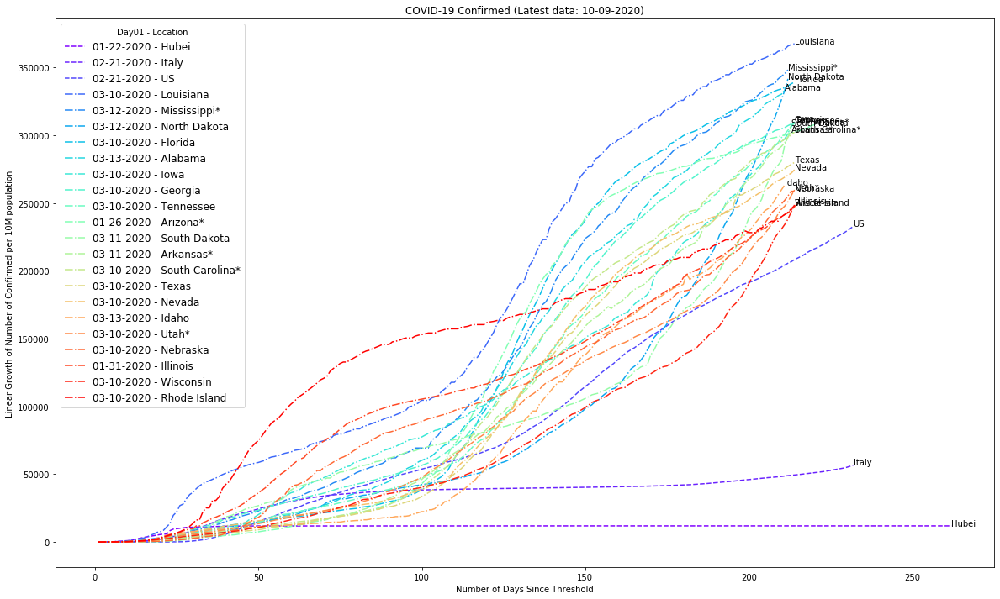

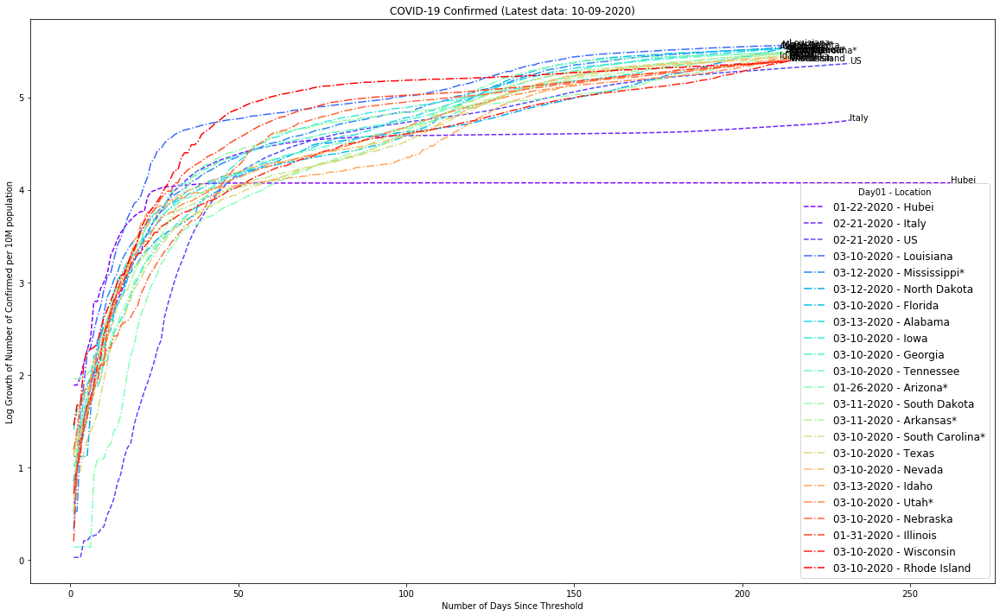

In [48]:
_plot_trend(us_confirmed_trend, us_top_confirmed_locs, 'Confirmed')
_plot_log_trend(us_confirmed_trend, us_top_confirmed_locs, 'Confirmed')

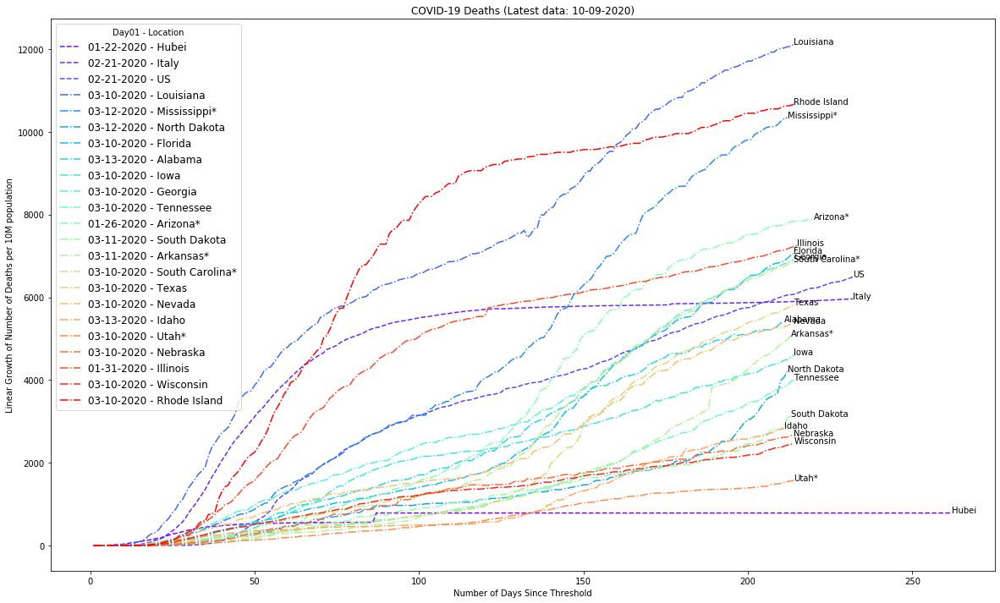

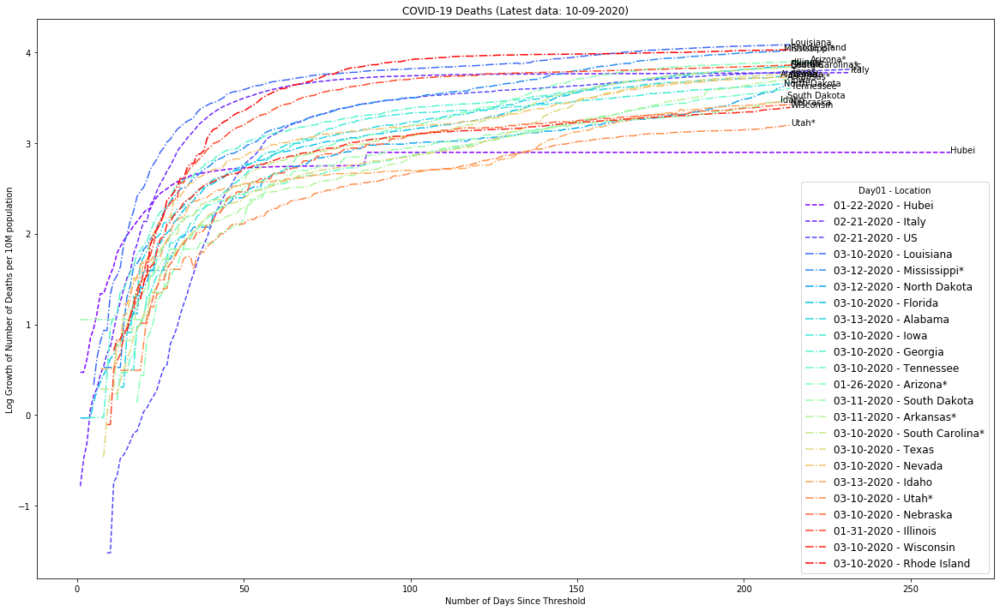

In [49]:
_plot_trend(us_confirmed_trend, us_top_confirmed_locs, 'Deaths')
_plot_log_trend(us_confirmed_trend, us_top_confirmed_locs, 'Deaths')

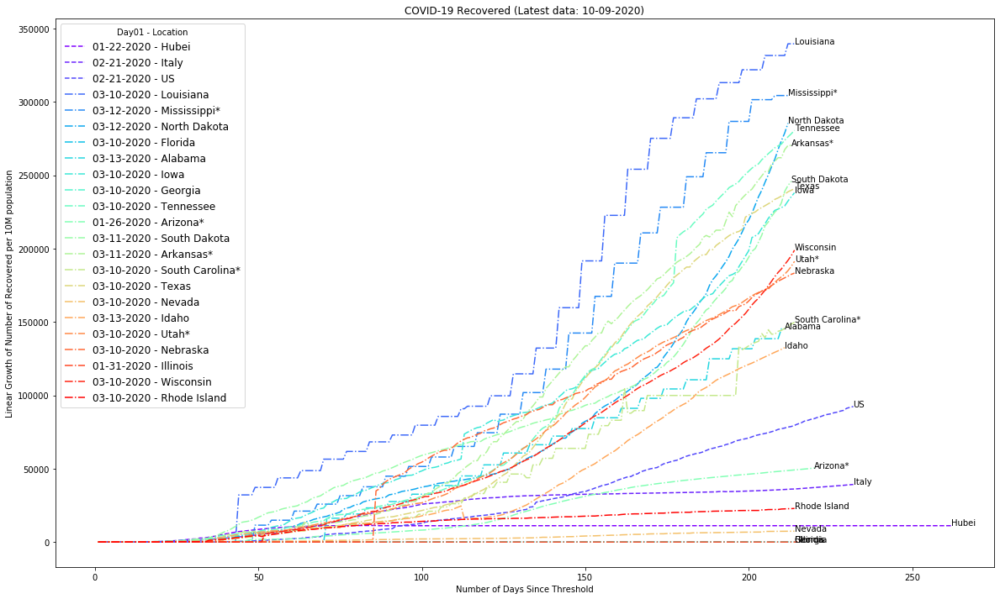

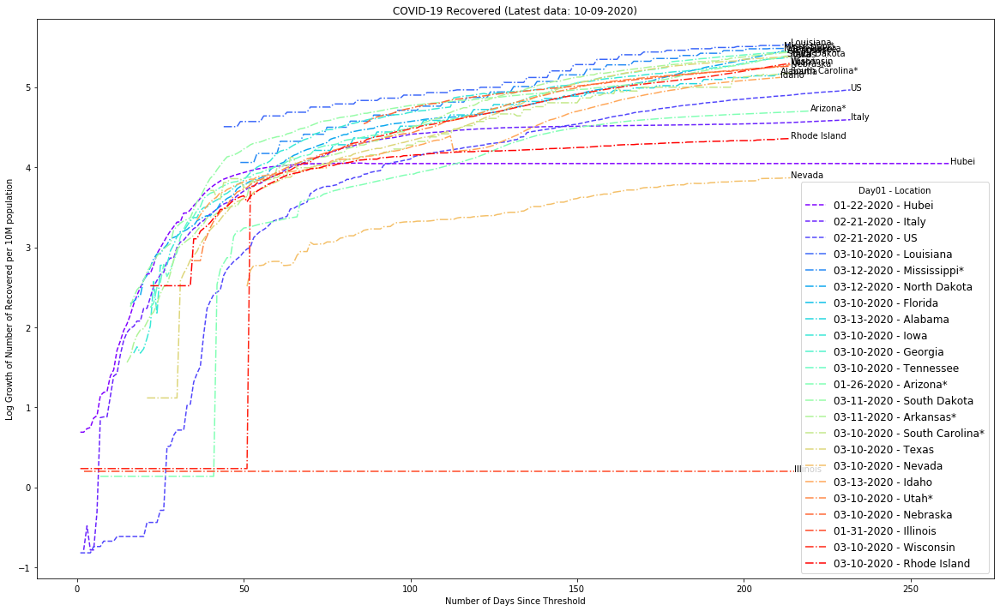

In [50]:
_plot_trend(us_confirmed_trend, us_top_confirmed_locs, 'Recovered')
_plot_log_trend(us_confirmed_trend, us_top_confirmed_locs, 'Recovered')

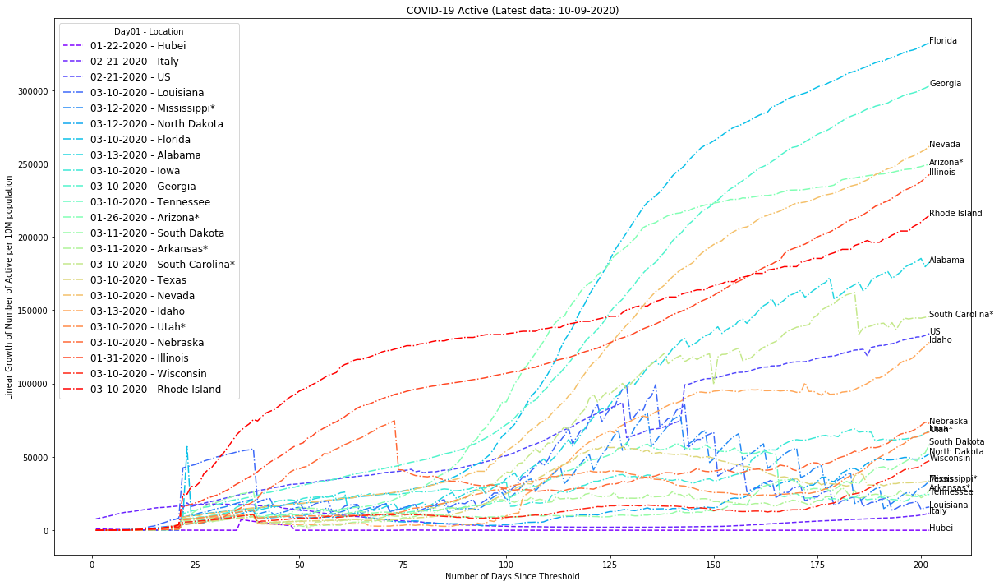

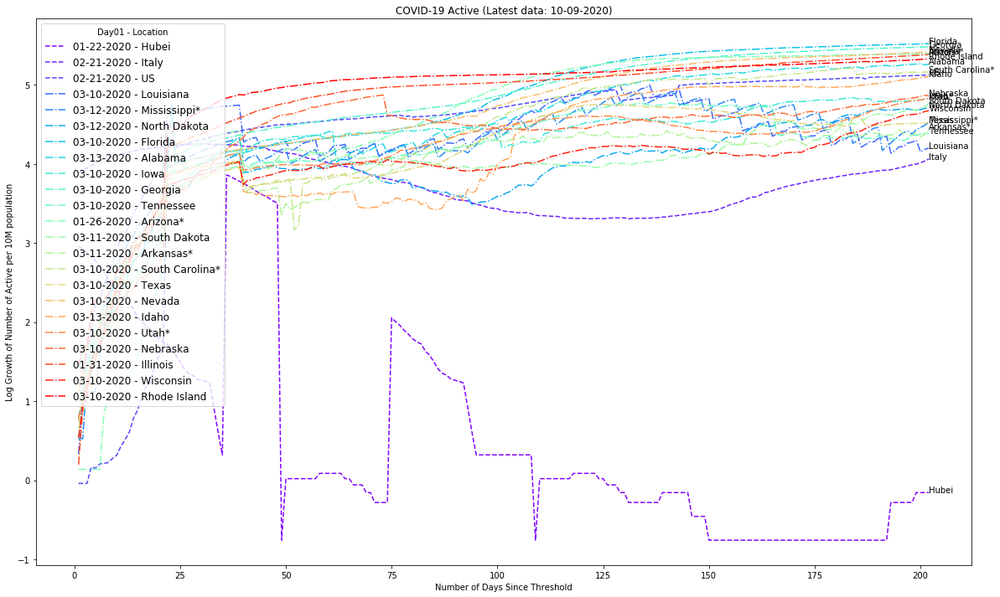

In [51]:
_plot_trend(us_confirmed_trend, us_top_confirmed_locs, 'Active')
_plot_log_trend(us_confirmed_trend, us_top_confirmed_locs, 'Active', leg_loc = "upper left")

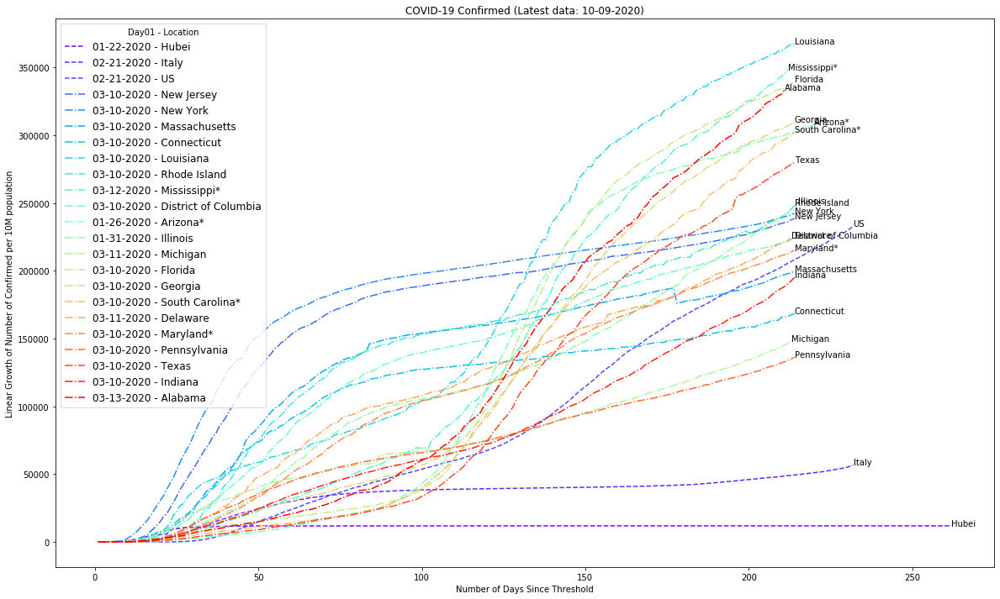

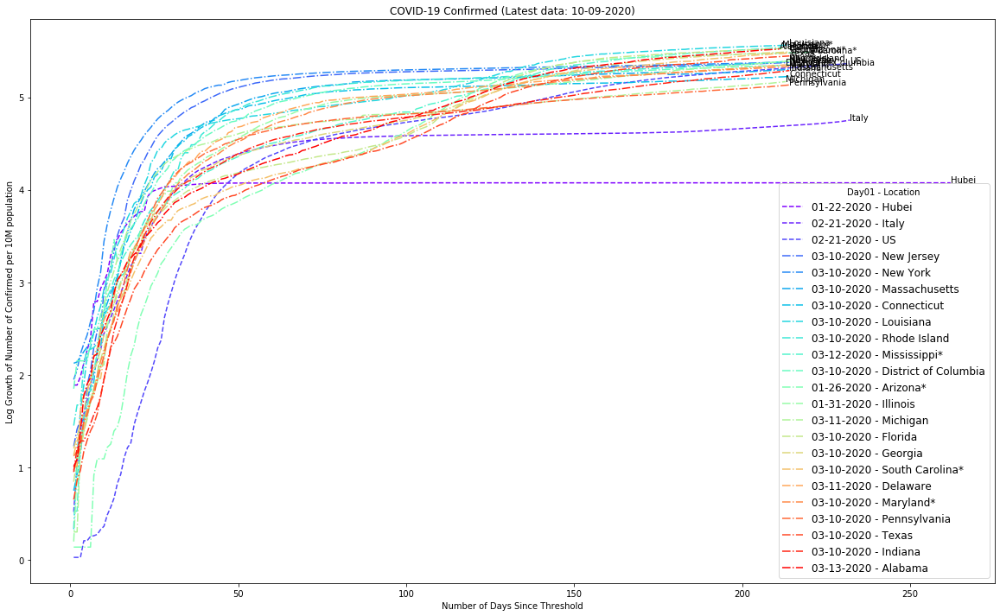

In [52]:
_plot_trend(us_deaths_trend, us_top_deaths_locs, 'Confirmed')
_plot_log_trend(us_deaths_trend, us_top_deaths_locs, 'Confirmed')

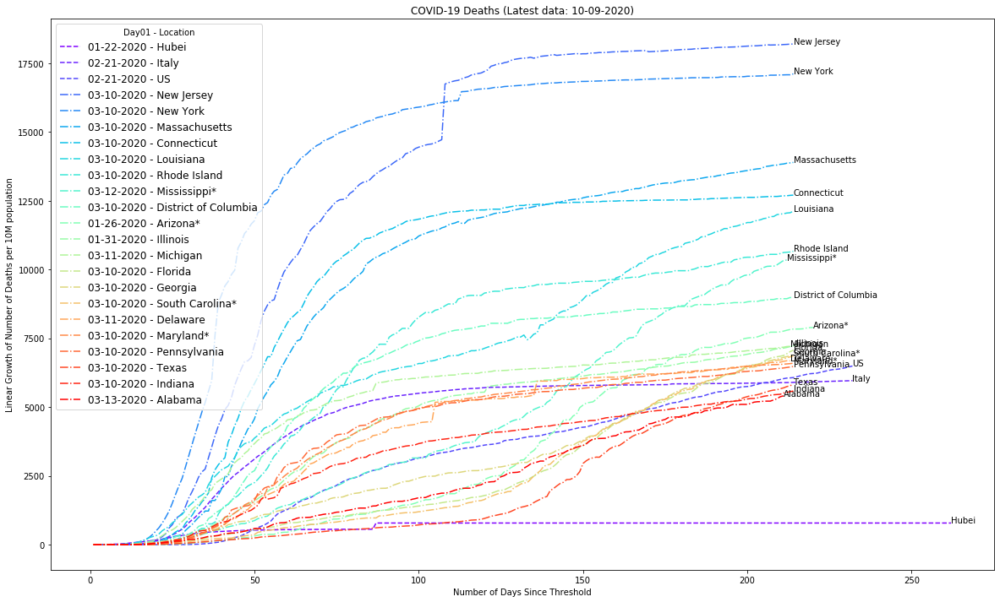

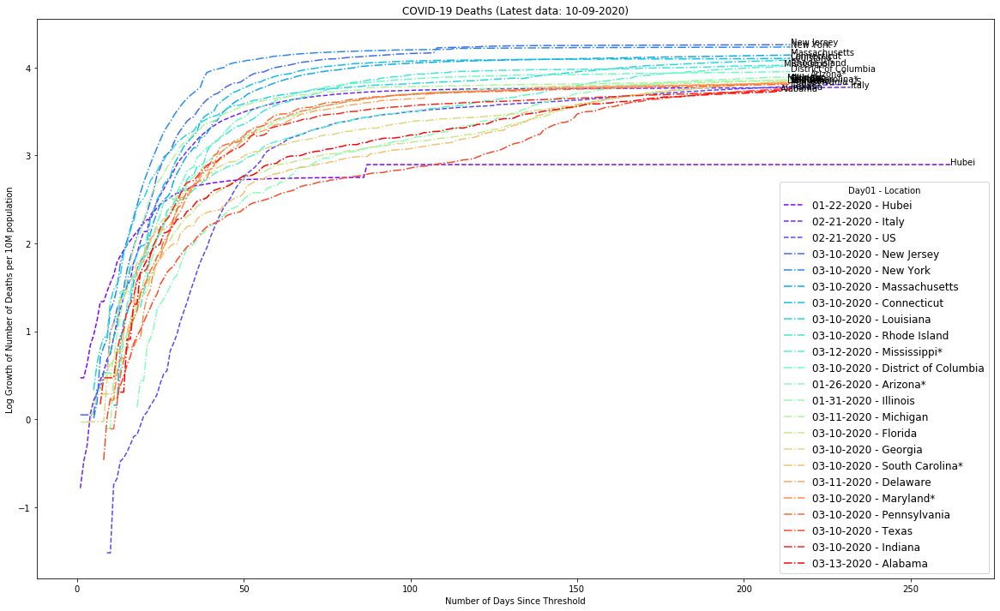

In [53]:
_plot_trend(us_deaths_trend, us_top_deaths_locs, 'Deaths')
_plot_log_trend(us_deaths_trend, us_top_deaths_locs, 'Deaths')

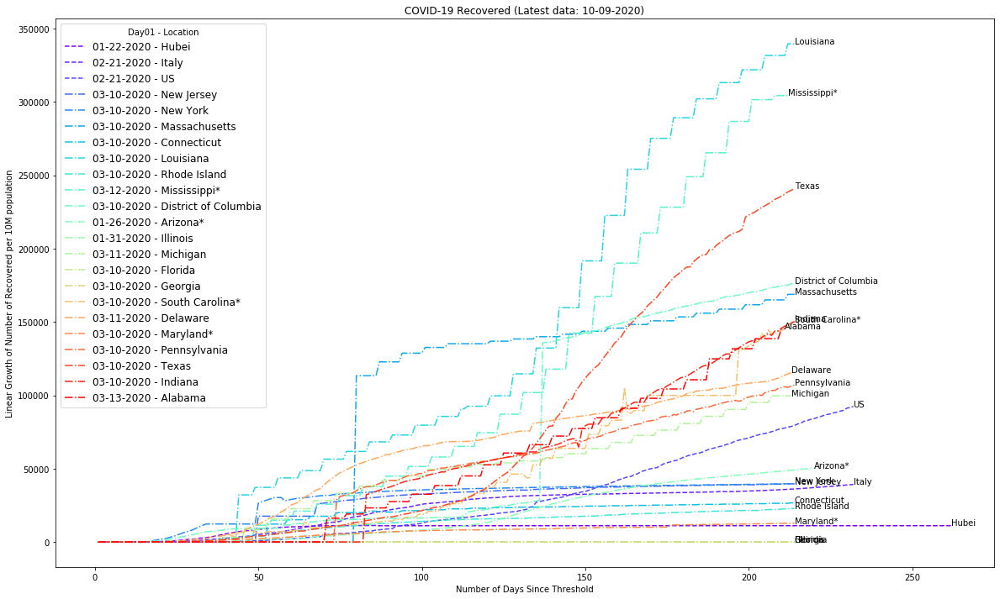

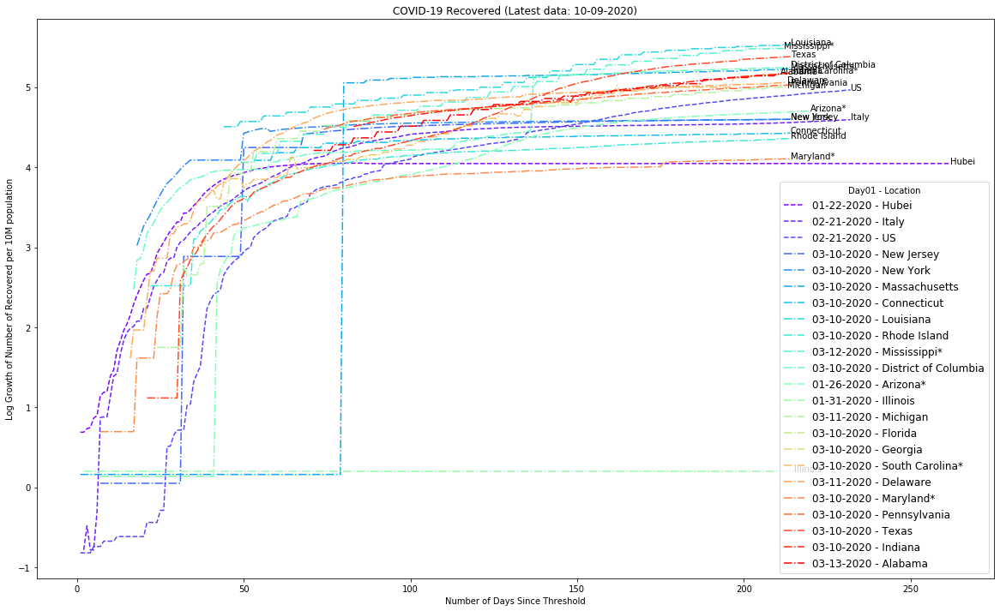

In [54]:
_plot_trend(us_deaths_trend, us_top_deaths_locs, 'Recovered')
_plot_log_trend(us_deaths_trend, us_top_deaths_locs, 'Recovered')

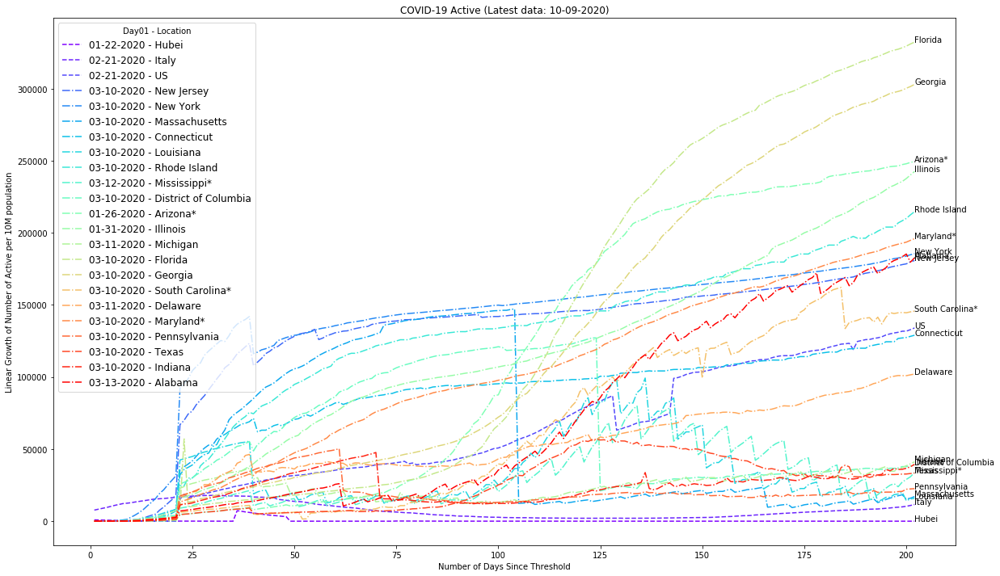

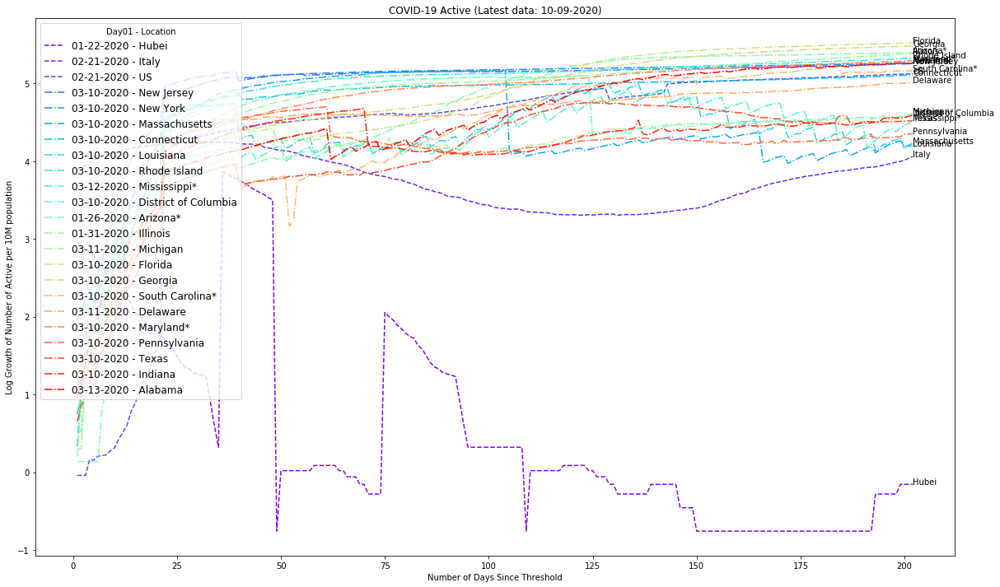

In [55]:
_plot_trend(us_deaths_trend, us_top_deaths_locs, 'Active')
_plot_log_trend(us_deaths_trend, us_top_deaths_locs, 'Active', leg_loc = "upper left")

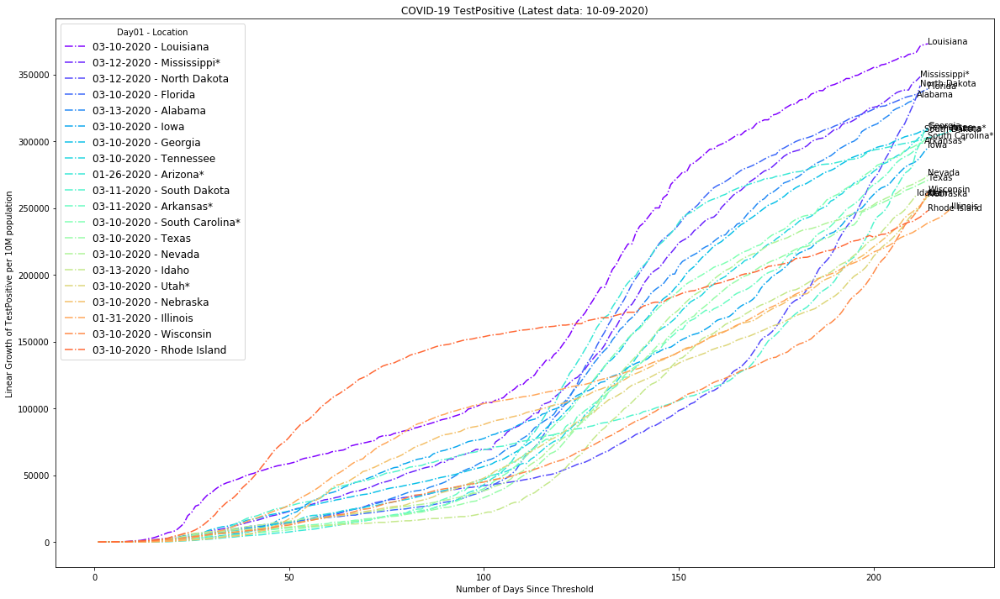

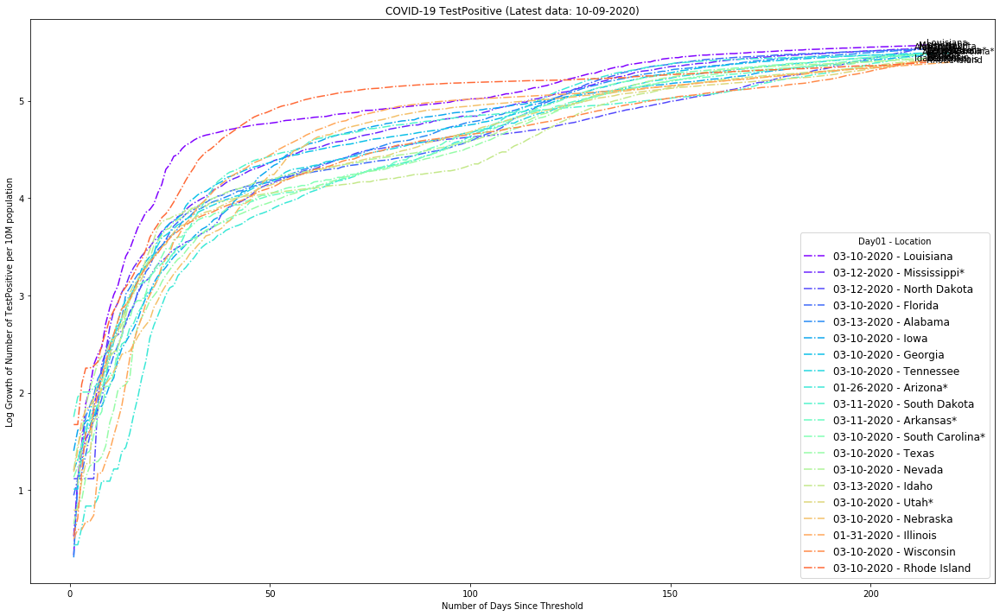

In [56]:
_plot_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'TestPositive')
_plot_log_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'TestPositive')

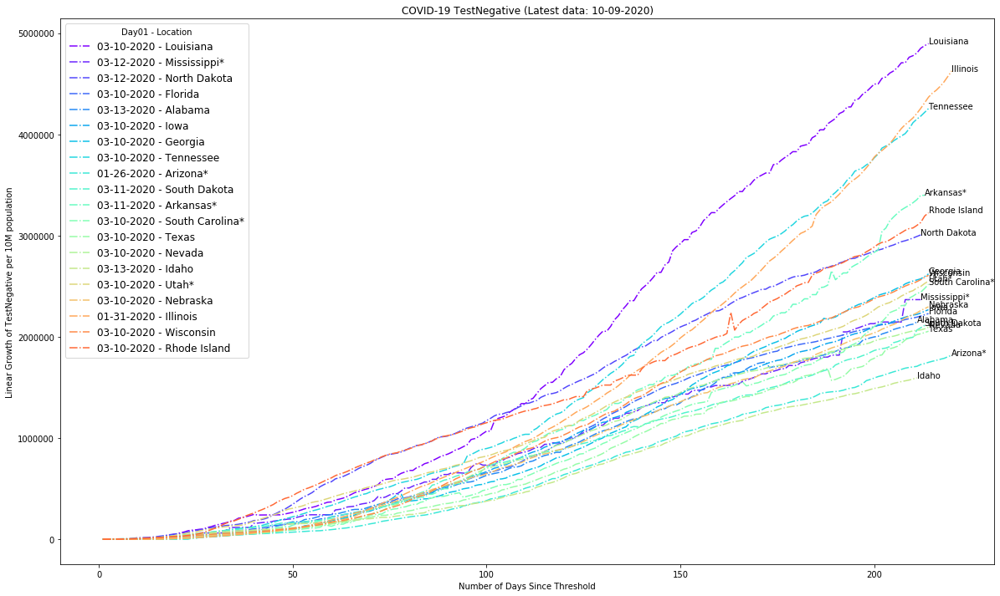

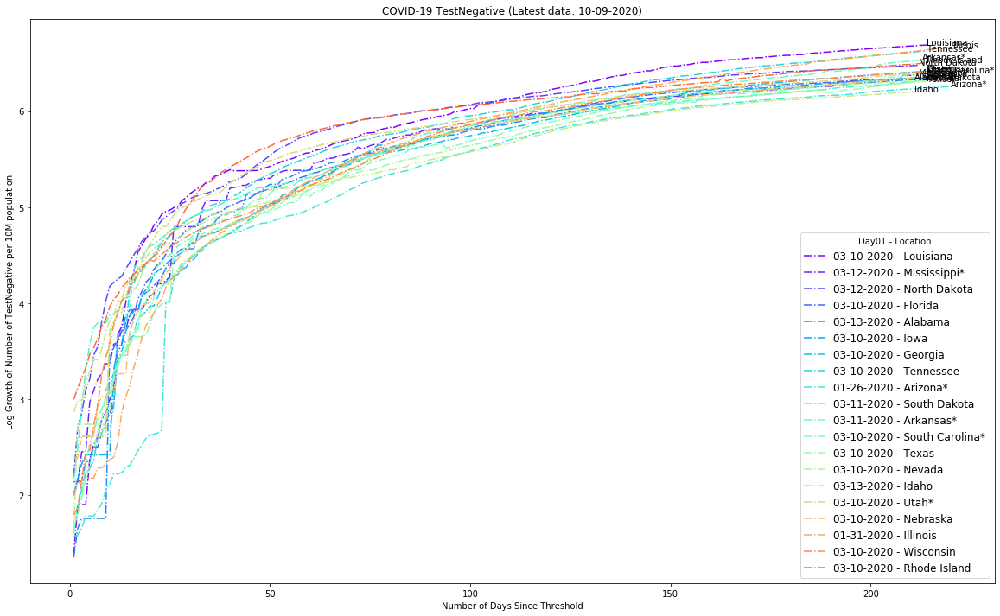

In [57]:
_plot_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'TestNegative')
_plot_log_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'TestNegative')

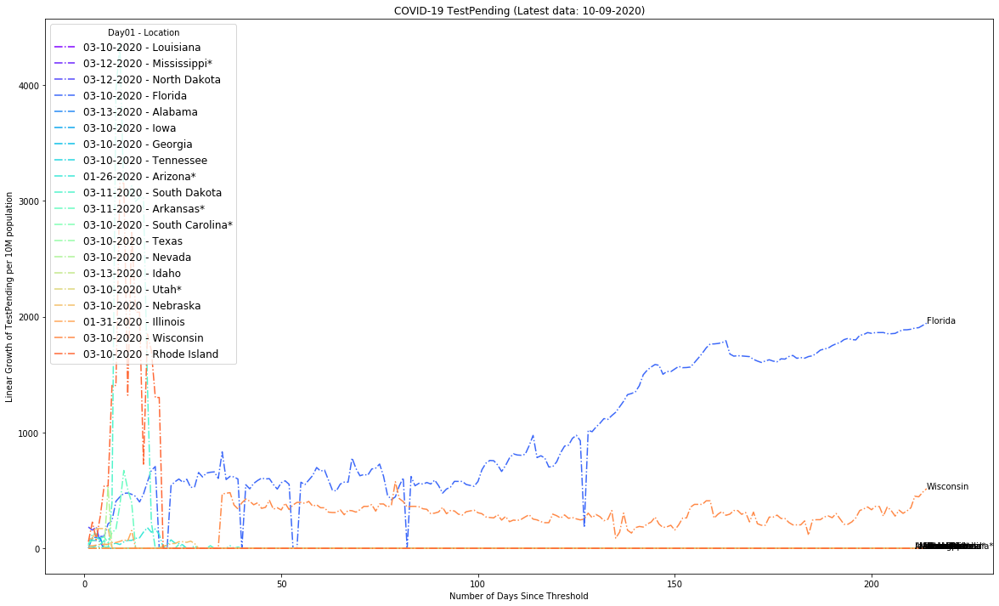

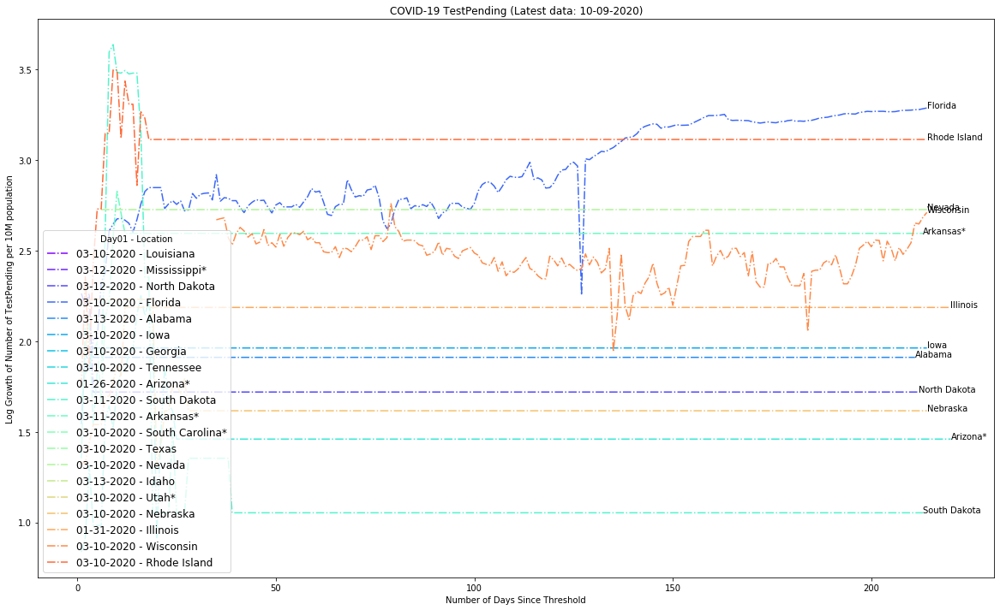

In [58]:
_plot_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'TestPending', leg_loc = "upper left")
_plot_log_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'TestPending', leg_loc = "lower left")

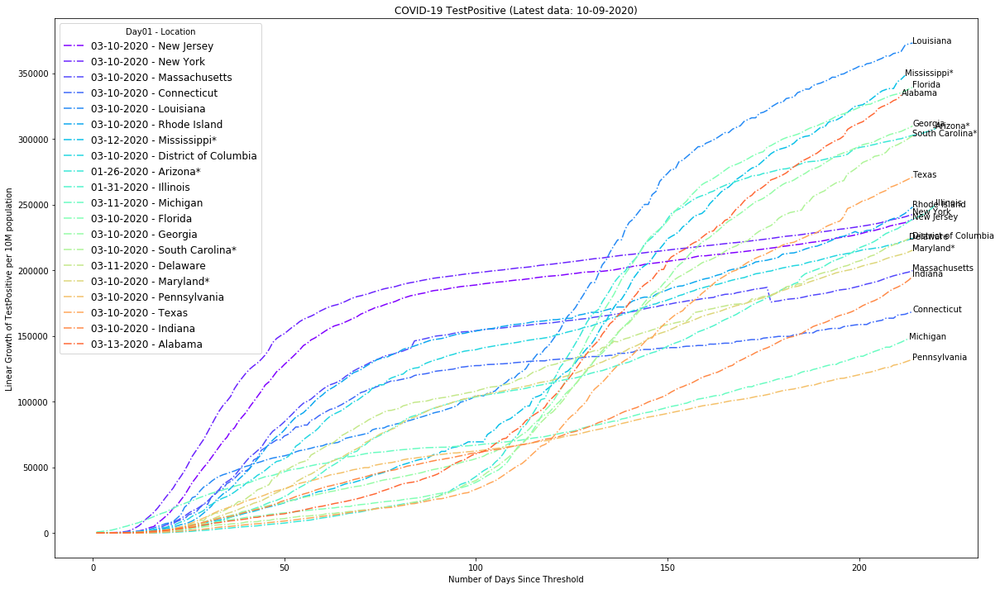

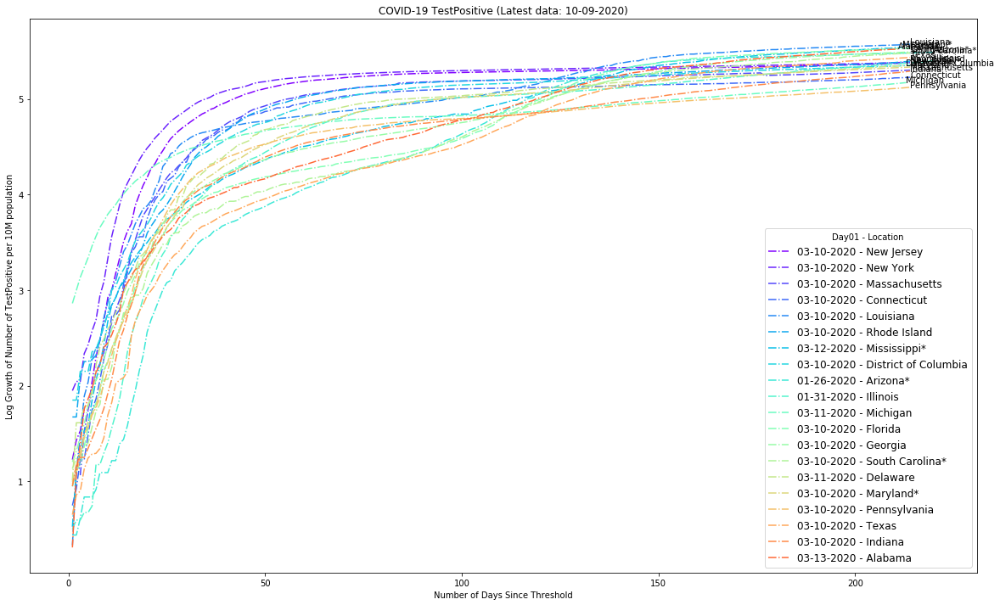

In [59]:
_plot_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'TestPositive')
_plot_log_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'TestPositive')

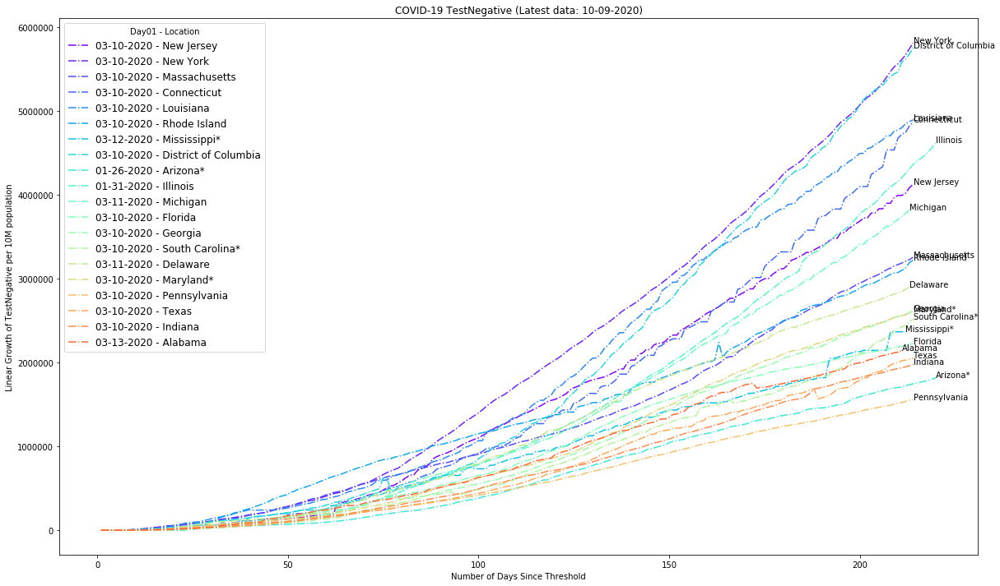

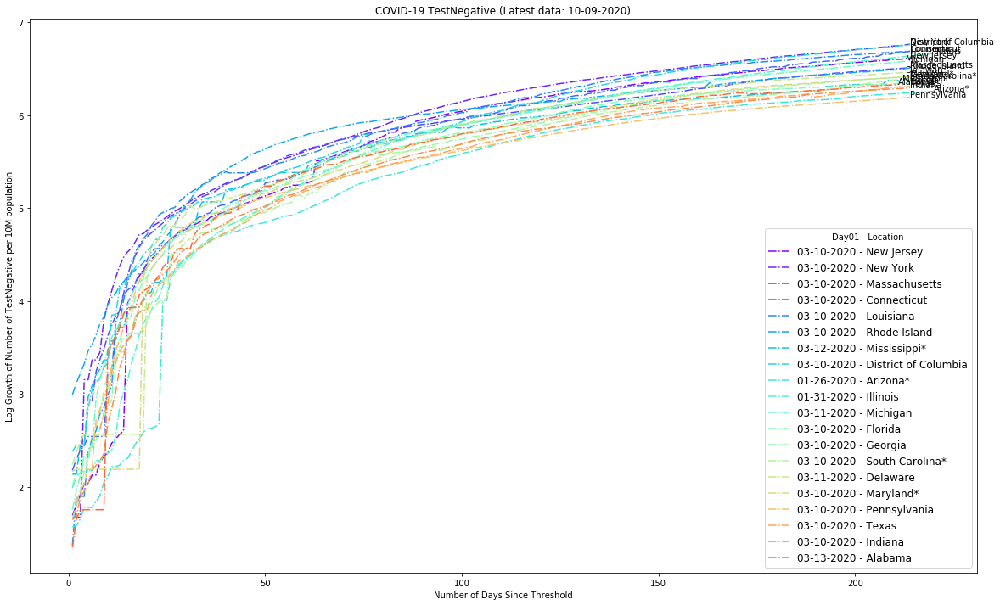

In [60]:
_plot_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'TestNegative')
_plot_log_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'TestNegative')

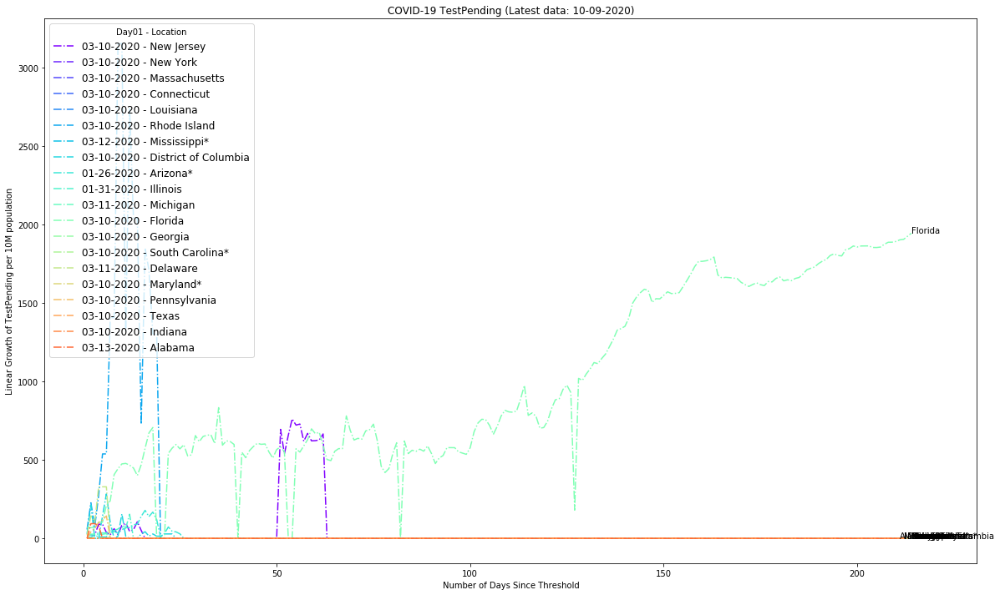

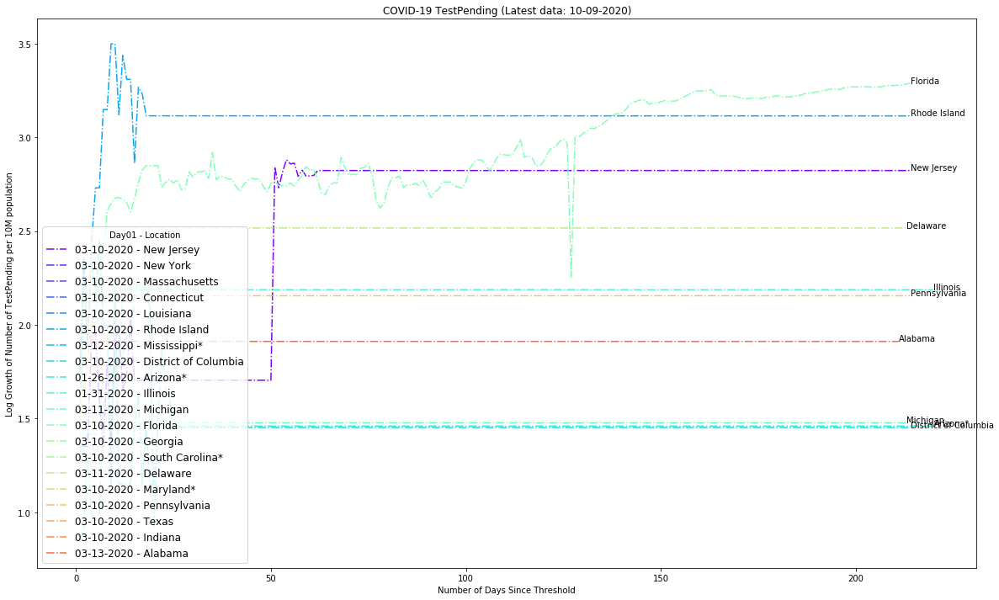

In [61]:
_plot_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'TestPending', leg_loc = "upper left")
_plot_log_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'TestPending', leg_loc = "lower left")

In [62]:
_plot_clinical_bar(us_deaths_trend, ["New York", "New Jersey"], [("TestPositive", "TestNegative", "TestPending")])

In [63]:
_plot_clinical_bar(us_deaths_trend, ["Connecticut", "Texas"], [("TestPositive", "TestNegative", "TestPending")])

In [64]:
_plot_clinical_bar(us_deaths_trend, ["Massachusetts", "Michigan"], [("TestPositive", "TestNegative", "TestPending")])

In [65]:
_plot_clinical_bar(us_deaths_trend, ["North Carolina", "Pennsylvania"], [("TestPositive", "TestNegative", "TestPending")])

In [66]:
_plot_clinical_bar(us_deaths_trend, ["California", "Florida"], [("TestPositive", "TestNegative", "TestPending")])

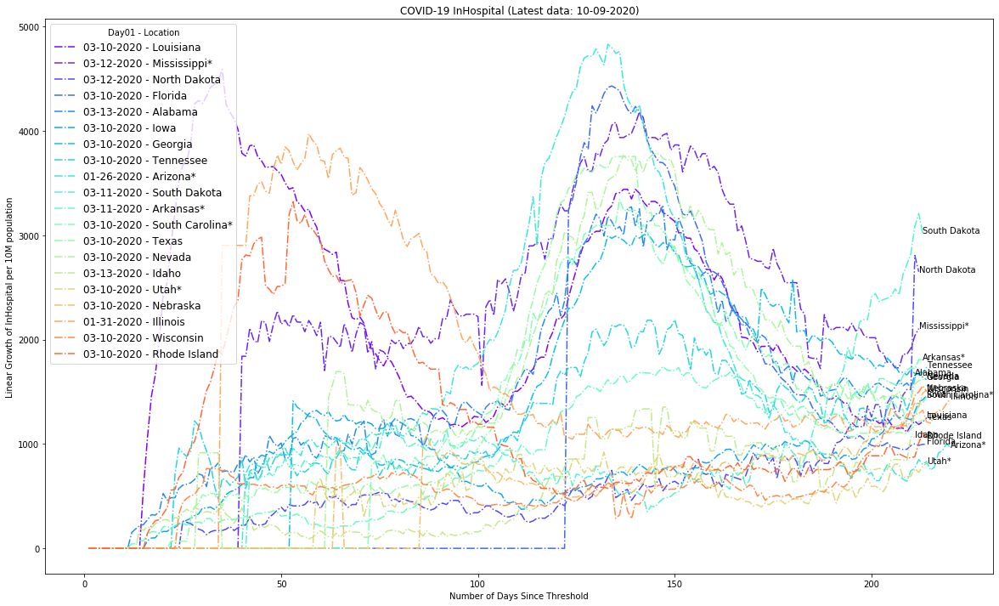

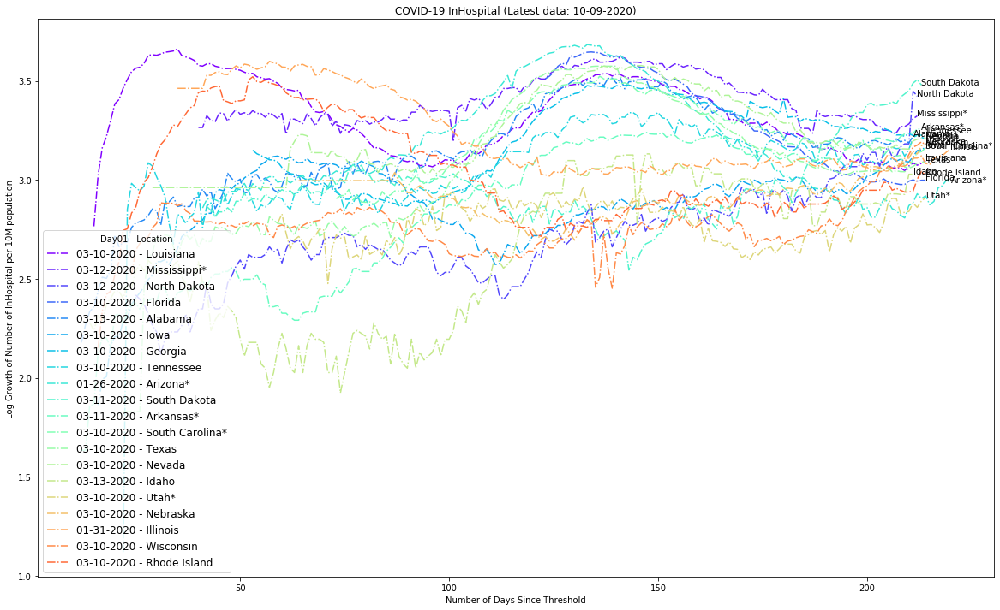

In [67]:
_plot_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'InHospital')
_plot_log_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'InHospital', leg_loc = "lower left")

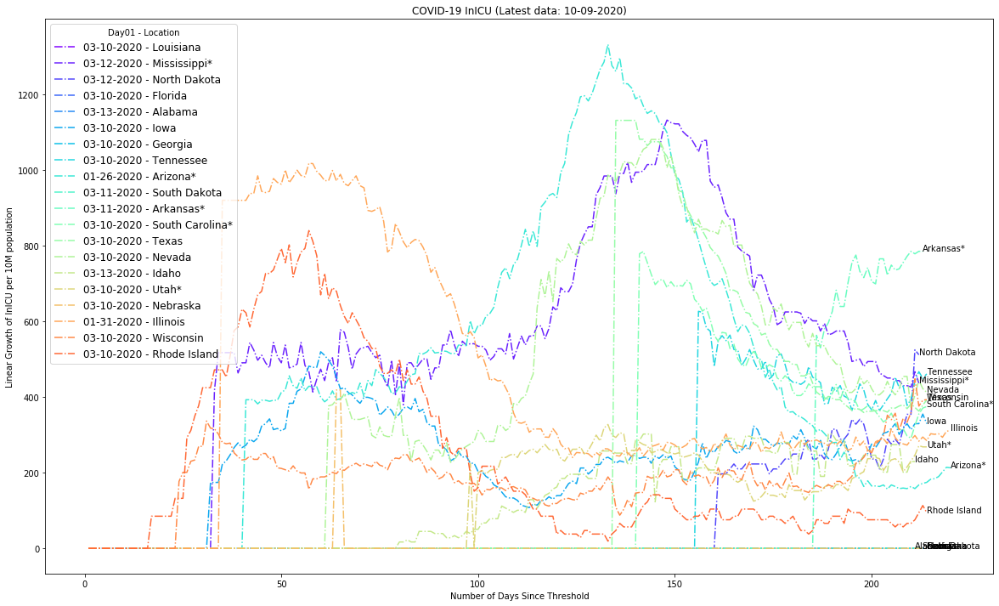

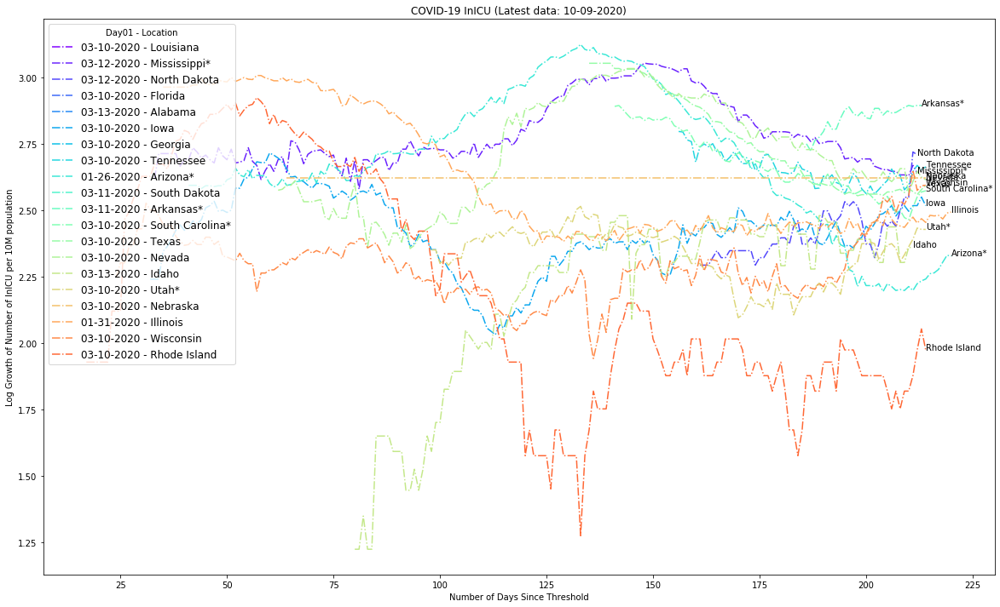

In [68]:
_plot_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'InICU')
_plot_log_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'InICU', leg_loc = "upper left")

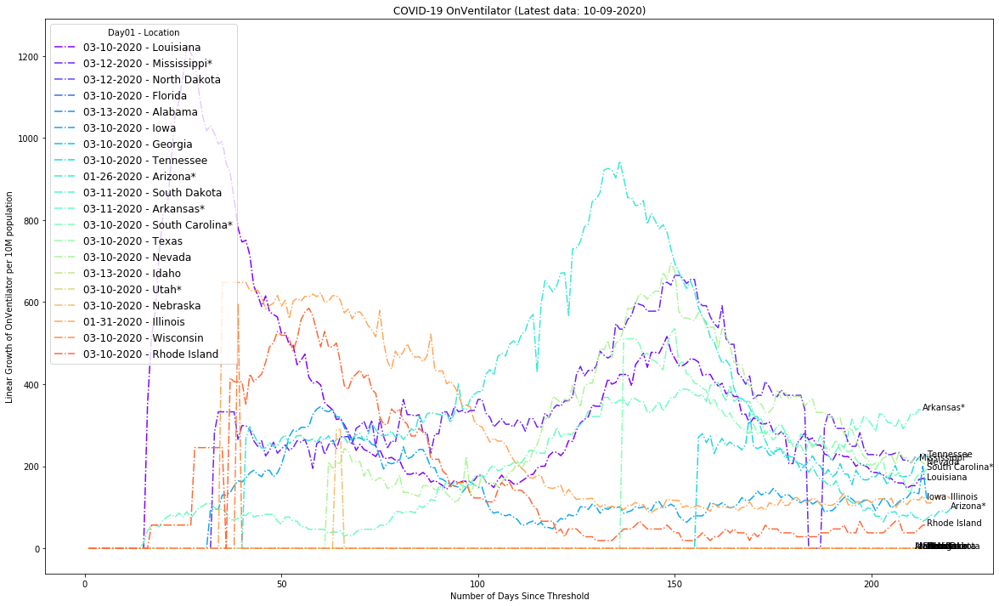

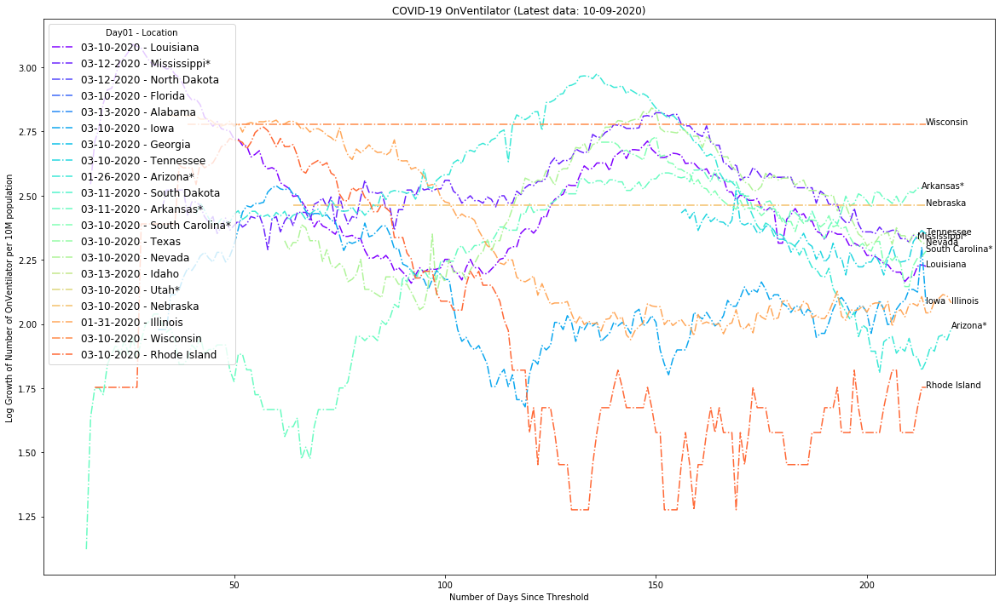

In [69]:
_plot_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'OnVentilator')
_plot_log_clinical_trend(us_confirmed_trend, us_top_confirmed_locs, 'OnVentilator', leg_loc = "upper left")

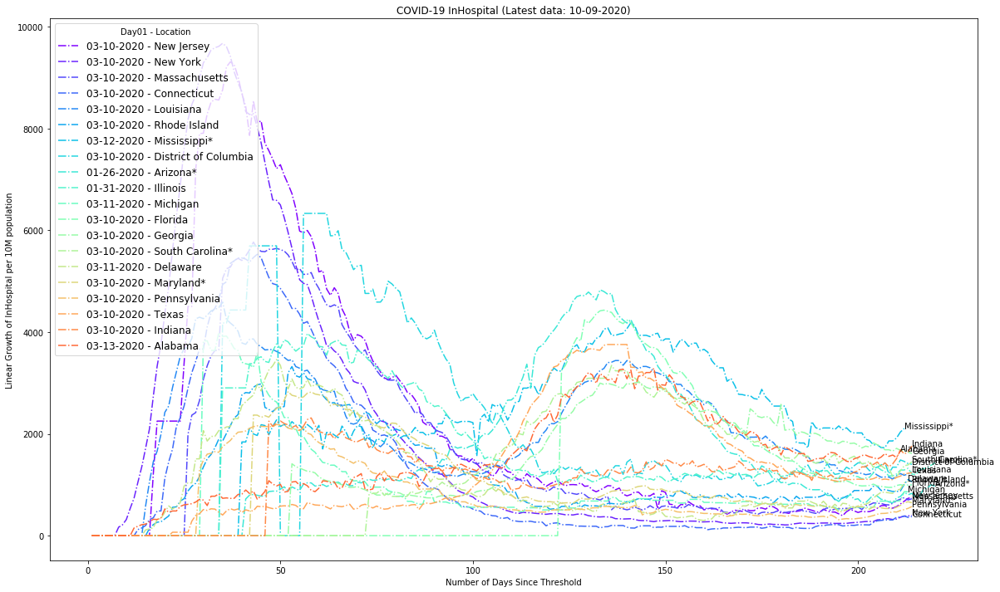

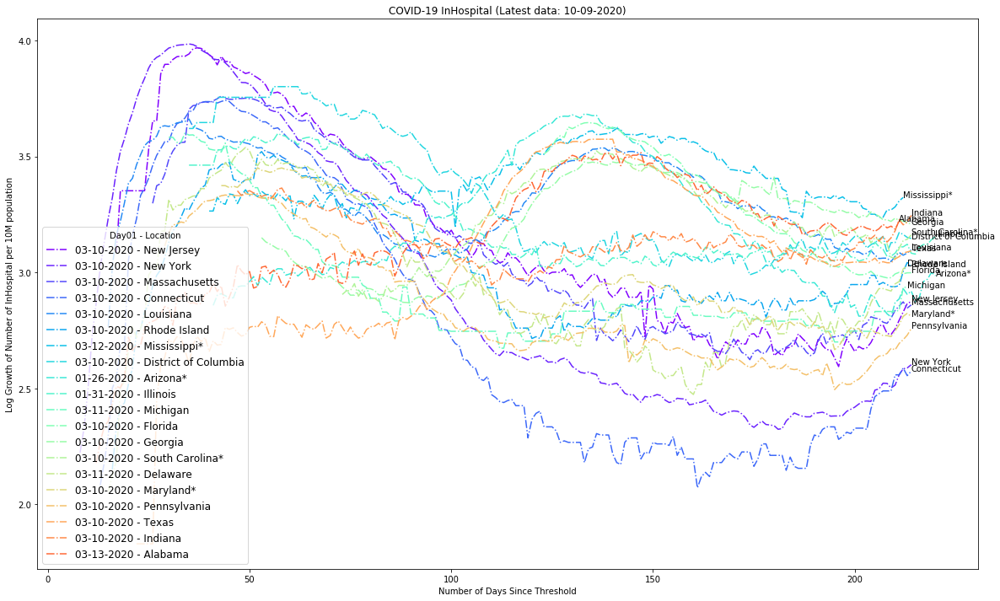

In [70]:
_plot_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'InHospital')
_plot_log_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'InHospital', leg_loc = "lower left")

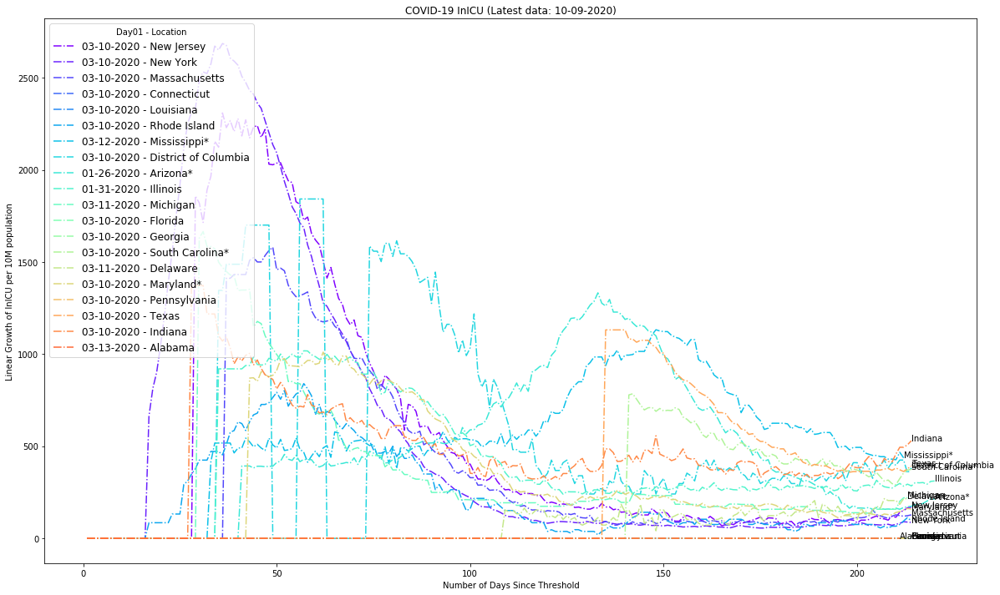

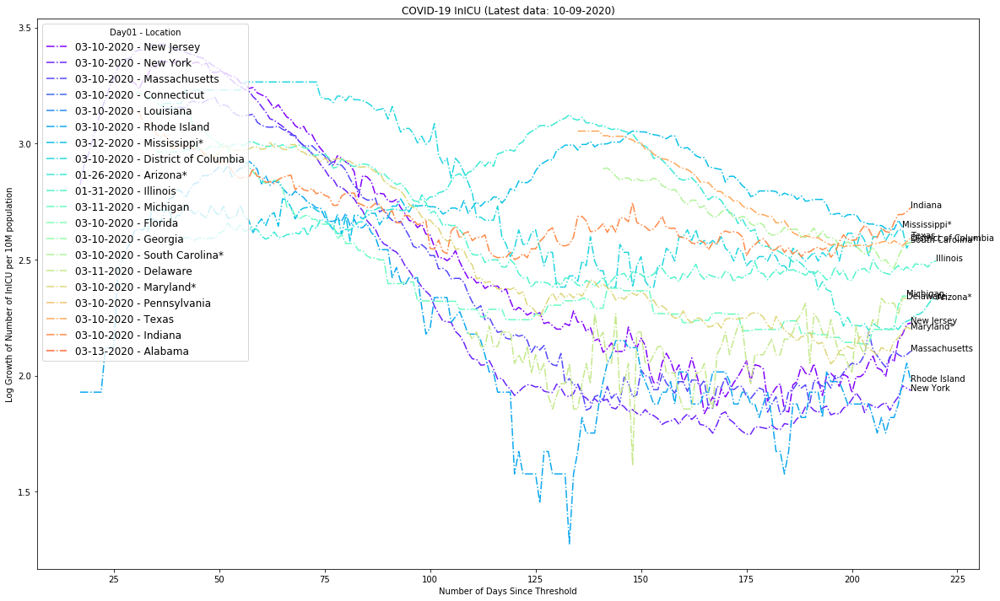

In [71]:
_plot_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'InICU')
_plot_log_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'InICU', leg_loc = "upper left")

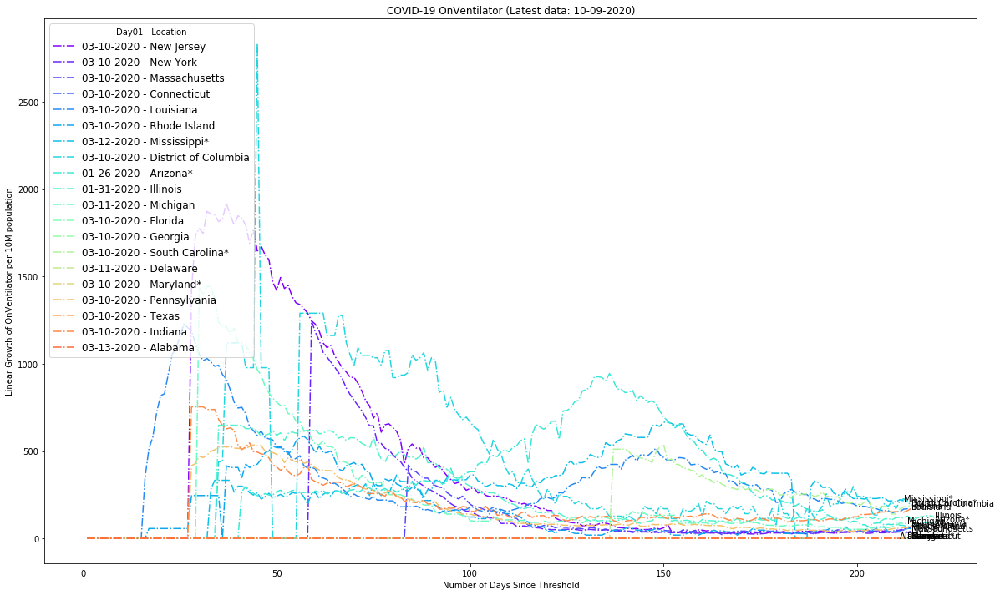

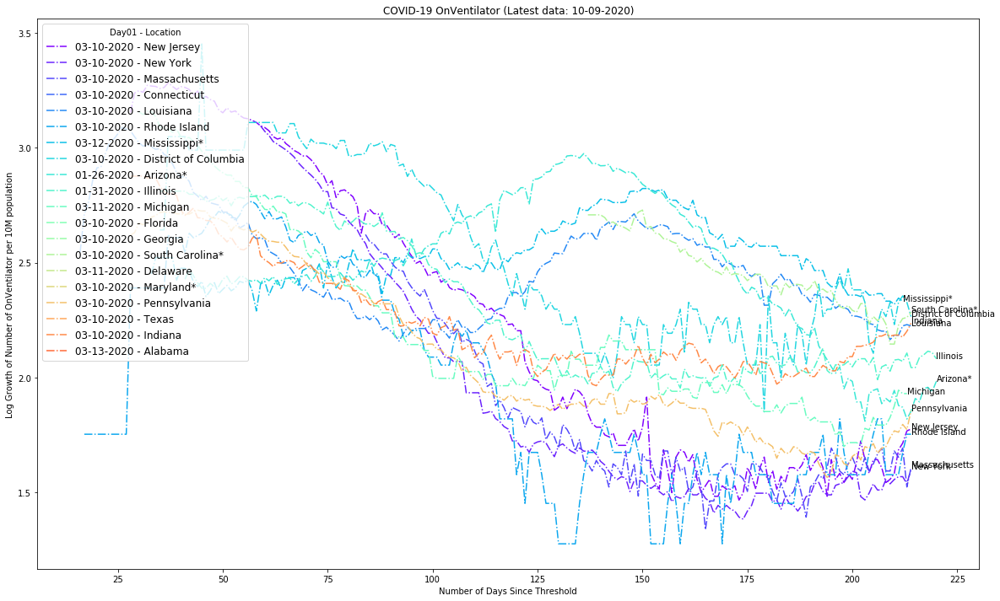

In [72]:
_plot_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'OnVentilator')
_plot_log_clinical_trend(us_deaths_trend, us_top_deaths_locs, 'OnVentilator', leg_loc = "upper left")

In [73]:
_plot_clinical_bar(us_deaths_trend, ["New York", "New Jersey"], [("InHospital",), ("InICU", "OnVentilator")])

In [74]:
_plot_clinical_bar(us_deaths_trend, ["Connecticut", "Texas"], [("InHospital",), ("InICU", "OnVentilator")])

In [75]:
_plot_clinical_bar(us_deaths_trend, ["Massachusetts", "Michigan"], [("InHospital",), ("InICU", "OnVentilator")])

In [76]:
_plot_clinical_bar(us_deaths_trend, ["North Carolina", "Pennsylvania"], [("InHospital",), ("InICU", "OnVentilator")])

In [77]:
_plot_clinical_bar(us_deaths_trend, ["California", "Florida"], [("InHospital",), ("InICU", "OnVentilator")])